<center>
<h4>Universidad Nacional de Córdoba - Facultad de Matemática, Astronomía, Física y Computación</h4>
<h3>Diplomatura en Ciencia de Datos, Aprendizaje Automático y sus Aplicaciones</h3>
 <h2>Mentoría: Clasificación diagnóstica de mamografías </h2>
</center>

<h3> Práctico I -  Análisis y Visualización de Datos<h3>
    <h4>Integrantes:Mario Agustín Sgró, Lucía Benítez, Germán Bertea y Carolina Díaz <h4>

Inicialmente, como en toda exploración de datos tenemos muy poca información *a priori* sobre el significado de los datos y tenemos que empezar por comprenderlos.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import matplotlib.patches as mpatches
import seaborn as sns
#import pandas_profiling as pp

%matplotlib inline
plt.rcParams['figure.figsize'] = (200, 200)

In [2]:
pd.options.display.max_columns = 200
pd.options.display.max_rows = 1000

Comenzamos la lectura del dataset:

In [3]:
dataframe = pd.read_csv('datos/Datos_Mamografias.csv',sep=',')
dataframe.sample(10)

,Imagen,Age,View,Laterality,Dcm_1,Dcm_2,Dcm_3,Dcm_4,Dcm_5,Dcm_6,Dcm_7,Dcm_8,Dcm_9,Dcm_10,Dcm_11,Dcm_12,Dcm_13,Dcm_14,Dcm_15,Dcm_16,Dcm_17,Dcm_18,Dcm_19,Dcm_20,Dcm_21,Dcm_22,Dcm_23,Area,Promedio,Media,Desvio,Asimetria,Kurtosis,Moda,Desvio_L1,Desvio_L2,Desvio_L3,Asimetria_L1,Asimetria_L2,Asimetria_L3,promGradiente,Relacion,Relacion_L1,Relacion_L2,Relacion_L3,Relacion_L4,EP,EPBinaria,RelEntropia,Haralick_1,Haralick_2,Haralick_3,Haralick_4,Haralick_5,Haralick_6,Haralick_7,Haralick_8,Haralick_9,Haralick_10,Haralick_11,Haralick_12,Haralick_13,Haralick_14,Haralick_15,Haralick_16,Haralick_17,Haralick_18,Haralick_19,Haralick_20,Haralick_21,Haralick_22,Haralick_23,Haralick_24,Haralick_25,Haralick_26,Haralick_27,Haralick_28,Haralick_29,Haralick_30,Haralick_31,Haralick_32,Haralick_33,Haralick_34,Haralick_35,Haralick_36,Haralick_37,Haralick_38,Haralick_39,Haralick_40,Haralick_41,Haralick_42,Haralick_43,Haralick_44,Haralick_45,Haralick_46,Haralick_47,Haralick_48,Haralick_49,Haralick_50,Haralick_51,Haralick_52,DF1,DF2,DF3,DF4,DF5,DF6,DF7,DF8,DF9,DF10,DF11,DF12,DF13,DF14,DF15,DF16,DF17,DF18,DF19,DF20,DF21,DF22,DF23,DF24,DF25,DF26,DF27,DF28,DF29,DF30,DF31,DF32,DF33,DF34,DF35,DF36,DF37,DF38,DF39,DF40,DF41,DF42,DF43,DF44,DF45,DF46,DF47,DF48,DFb1,DFb2,DFb3,DFb4,DFb5,DFb6,DFb7,DFb8,DFb9,DFb10,DFb11,DFb12,DFb13,DFb14,DFb15,DFb16,DFb17,DFb18,DFb19,DFb20,DFb21,DFb22,DFb23,DFb24,DFb25,DFb26,DFb27,DFb28,DFb29,DFb30,DFb31,DFb32,DFb33,DFb34,DFb35,DFb36,DFb37,DFb38,DFb39,DFb40,DFb41,DFb42,DFb43,DFb44,DFb45,DFb46,DFb47,DFb48,ACR
1507,Imagen_1507.npy,40.0,MLO,R,28.0,120.0,139.0,1162.0,RHODIUM,0.05,0.3,TUNGSTEN,85.0,25.90000,700.0,590.0,1.073,-44.7,MANUAL,Manual,50.0,6.09,0.0096,0.504,2047.0,4096.0,YES,1388982.0,1279.907557,1119.0,683.982045,1.080658,0.826567,771.0,736.874241,636.995682,725.910236,1.574310,1.389195,1.136235,23.911348,36.998824,40.640689,23.730235,26.252222,32.132354,0.768231,0.082920,0.375000,0.000002,18219.911471,0.980520,467655.006275,0.012656,2559.812639,1.852400e+06,12.220489,19.191728,1.086689e-06,8.092782,-0.246146,0.997709,0.000002,21392.577367,0.977149,468095.217177,0.011592,2560.747215,1.850988e+06,12.219798,19.277837,9.991906e-07,8.206635,-0.238322,0.997281,0.000002,17551.742208,0.981240,467785.176927,0.013026,2560.167407,1.853589e+06,12.221387,19.169614,1.110639e-06,8.065254,-0.248212,0.997811,0.000002,20469.567908,0.978098,467303.563071,0.011840,2559.550956,1.848745e+06,12.219153,19.258490,1.019128e-06,8.177884,-0.239945,0.997375,1.255290,0.017303,289.119003,54.493826,1.496128,-1.257477,1.672003,0.382852,706.985227,155.249015,-0.854284,-0.219828,1.667067,0.336623,1244.898903,172.478630,-1.089666,0.229887,1.555265,0.173453,1920.294957,226.374501,-1.089353,0.327441,1.423828,0.088394,2835.245681,357.341406,-0.043014,0.795217,1.595970,0.261846,2229.161894,514.054097,0.038938,0.863723,1.739452,0.598910,1675.474655,608.683570,0.625890,1.115722,1.818723,0.982462,1297.564931,676.978864,0.854262,1.112249,1.289990,0.021746,353.171793,92.813181,12.508962,-0.873165,1.576805,0.211312,908.701501,248.057275,2.381148,-1.444739,1.661944,0.333982,1223.697927,350.561656,0.261480,-0.084429,1.567274,0.204317,1789.191471,433.604207,1.106437,0.043659,1.367060,0.061234,2336.751261,331.049289,28.967309,-4.022281,1.499084,0.146069,1554.987821,283.700783,17.014756,-1.503167,1.554872,0.196710,974.657790,260.451998,22.559019,0.901363,1.234395,0.036872,497.775242,567.415854,7.993181,2.496770,b
1123,Imagen_1123.npy,58.0,CC,R,27.0,100.0,55.0,548.0,MOLYBDENUM,0.03,0.3,MOLYBDENUM,40.0,94.00020,660.0,640.0,1.000,-5.0,AUTO_FILTER,LORAD AUTO AEC,376.0,5.51,0.0119,0.339,2047.0,4096.0,NO,3174677.0,1137.389590,1012.0,641.308956,1.543083,2.864231,658.0,962.043415,505.743341,331.494699,1.329120,1.548951,0.657114,19.616787,19.436906,42.738722,19.498392,13.751081,6.261505,0.768021,0.046171,0.663043,0.000005,21420.632219,0.973921,410686.060702,0.011622,2273.833637,1.621324e+06,12.026574,18.070610,9.921066e-07,8.222649,-0.207026,0.992268,0.000005,27260.133437,0.966821,410801

In [4]:
print("El data set consiste de ",dataframe.shape[0]," imagenes, con ",dataframe.shape[1]," registros cada una.")

El data set consiste de  6613  imagenes, con  198  registros cada una.


Nombres de las variables/features/características:


In [5]:
dataframe.columns.values

array(['Imagen', 'Age', 'View', 'Laterality', 'Dcm_1', 'Dcm_2', 'Dcm_3',
       'Dcm_4', 'Dcm_5', 'Dcm_6', 'Dcm_7', 'Dcm_8', 'Dcm_9', 'Dcm_10',
       'Dcm_11', 'Dcm_12', 'Dcm_13', 'Dcm_14', 'Dcm_15', 'Dcm_16',
       'Dcm_17', 'Dcm_18', 'Dcm_19', 'Dcm_20', 'Dcm_21', 'Dcm_22',
       'Dcm_23', 'Area', 'Promedio', 'Media', 'Desvio', 'Asimetria',
       'Kurtosis', 'Moda', 'Desvio_L1', 'Desvio_L2', 'Desvio_L3',
       'Asimetria_L1', 'Asimetria_L2', 'Asimetria_L3', 'promGradiente',
       'Relacion', 'Relacion_L1', 'Relacion_L2', 'Relacion_L3',
       'Relacion_L4', 'EP', 'EPBinaria', 'RelEntropia', 'Haralick_1',
       'Haralick_2', 'Haralick_3', 'Haralick_4', 'Haralick_5',
       'Haralick_6', 'Haralick_7', 'Haralick_8', 'Haralick_9',
       'Haralick_10', 'Haralick_11', 'Haralick_12', 'Haralick_13',
       'Haralick_14', 'Haralick_15', 'Haralick_16', 'Haralick_17',
       'Haralick_18', 'Haralick_19', 'Haralick_20', 'Haralick_21',
       'Haralick_22', 'Haralick_23', 'Haralick_24', 'H

Tipo de las variables/features/características:

In [6]:
dataframe.dtypes

Imagen            object
Age              float64
View              object
Laterality        object
Dcm_1            float64
Dcm_2            float64
Dcm_3            float64
Dcm_4            float64
Dcm_5             object
Dcm_6            float64
Dcm_7            float64
Dcm_8             object
Dcm_9            float64
Dcm_10           float64
Dcm_11           float64
Dcm_12           float64
Dcm_13           float64
Dcm_14           float64
Dcm_15            object
Dcm_16            object
Dcm_17           float64
Dcm_18            object
Dcm_19            object
Dcm_20           float64
Dcm_21           float64
Dcm_22           float64
Dcm_23            object
Area             float64
Promedio         float64
Media            float64
Desvio           float64
Asimetria        float64
Kurtosis         float64
Moda             float64
Desvio_L1        float64
Desvio_L2        float64
Desvio_L3        float64
Asimetria_L1     float64
Asimetria_L2     float64
Asimetria_L3     float64


Debido a que en las columnas 'Dcm_18' y 'Dcm_19' se observaron datos faltantes denotados como 'None',  se ha cambiado por 'np.nan' para que se puedan leer como números los datos de tales columnas:

In [7]:
dataframe['Dcm_18'].replace('None',np.nan,inplace=True)
dataframe['Dcm_19'].replace('None',np.nan,inplace=True)

dataframe.Dcm_18 = dataframe.Dcm_18.astype(float)
dataframe.Dcm_19 = dataframe.Dcm_19.astype(float)

Dentro de la base de datos hay filas que contienen todos sus campos sin registro, y es por ello que las descartamos de los datos.

In [8]:
data = dataframe.dropna(axis=0)  
#contar cuántos nan y restar del total  ver si son los datos que faltan

# Análisis 

**1-¿Cuáles variables considera a priori las más importantes de analizar en el contexto dado?.**


In [9]:
var_float = data.select_dtypes(include=[np.float])
var_no_float = data.select_dtypes(exclude=[np.number])

print('Número de filas y columnas' + str('\n')+
      '   variables numéricas     '+ str(var_float.shape) + str('\n')
      + '   variables NO numéricas  ' + str(var_no_float.shape))

Número de filas y columnas
   variables numéricas     (6394, 189)
   variables NO numéricas  (6394, 9)


La base de datos contiene 9 variables categóricas y 189 variables numéricas, con 6394 filas de datos

### Analizando las variables No-Numéricas

In [10]:
Features = [x for x in data.columns if data[x].dtype != 'float64']
print(Features)

['Imagen', 'View', 'Laterality', 'Dcm_5', 'Dcm_8', 'Dcm_15', 'Dcm_16', 'Dcm_23', 'ACR']


In [11]:
for feature in Features[1:]:
    #print(feature,np.unique(data[feature]),data[feature].dtype)
    print(feature,data[feature].unique())

View ['CC' 'MLO' 'MLOID']
Laterality ['R' 'L']
Dcm_5 ['RHODIUM' 'SILVER' 'MOLYBDENUM']
Dcm_8 ['TUNGSTEN' 'MOLYBDENUM']
Dcm_15 ['AUTOMATIC' 'AUTO_FILTER' 'MANUAL']
Dcm_16 ['AutoFilter' 'LORAD AUTO AEC' 'Manual' 'MANUAL']
Dcm_23 ['NO' 'YES']
ACR ['c' 'b' 'a' 'd']


In [12]:
data.describe(include=['object'])

,Imagen,View,Laterality,Dcm_5,Dcm_8,Dcm_15,Dcm_16,Dcm_23,ACR
count,6394,6394,6394,6394,6394,6394,6394,6394,6394
unique,6394,3,2,3,2,3,4,2,4
top,Imagen_6528.npy,MLO,L,RHODIUM,TUNGSTEN,AUTOMATIC,AutoFilter,NO,c
freq,1,3304,3200,4244,4833,4364,4364,5711,2797


In [13]:
yes = data["Dcm_23"] == "YES"
no  = data["Dcm_23"] == "NO"
print("Mamografias con implantes: ",yes.sum())
print("Mamografias sin implantes: ",no.sum())

Mamografias con implantes:  683
Mamografias sin implantes:  5711


Entonces, para las variables:


* *'View'* se han tenido en cuenta la vista con la cuál se toman las mamografías, siendo respectivamente:
    *  CC:Vista craneo caudal de la imagen
    *  MLO: Vista oblicua mediolateral. 
    *  IDMLO: Vista oblicua mediolateral en pacientes con prótesis
    (porqué no hay CC de las de prótesis?)
    
    

* *'Laterality* se registró la lateralidad de la mama en:

    * 'L' : izquieda
    * 'R' : Derecha
    
    

* *'Dcm_5'* (FilterMaterial), se distinguió en el material del filtro: 
     * 'SILVER' :Plata 
     * 'MOLYBDENUM' : Molibdeno 
     * 'RHODIUM' : Rodio



* *'Dcm_8'* (AnodeTargetMaterial), el material del blanco del ánodo puede estar construido de: 
    * 'MOLYBDENUM':  Molibdeno
    * 'TUNGSTEN' : Tungsteno 



* *'Dcm_15'* (ExposureControlMode), modo de control de la exposición. 
    Existen tres posibles configuraciones: 
    * 'AUTOMATIC': Automático. 
    * 'AUTO_FILTER': Autofiltrado. 
    * 'MANUAL': Manual.



* *'Dcm_16'* (ExposureControlModeDescrip), descripción del modo de control de la exposición. 
    Existen tres posibles configuraciones: 
    * 'AutoFilter': Autofiltrado. 
    * 'MANUAL': Manual.
    * 'LORAD AUTO AEC' 
    * 'MANUAL' 
    * 'Manual' 
    


    Estas dos últimas, se debería cambiar ambas a 'Manual' ?. LORAD AUTO AEC será 'Automático'? 

* *'Dcm_23'* (BreastImplantPresent): presencia de implante mamario. Puede tomar dos valores:
    * 'NO' : Sí
    * 'YES': No


* *'ACR:'* clasificación BI-RADS del Colegio Americano de Radiología. Las mamas se clasifican en:
    * 'a' : mamas compuestas por tejido adiposo casi en su totalidad. La mamografía es muy sensible en este contexto, siempre que se incluya en el campo de la imagen el sector que contiene la anormalidad.
    * 'b' : se observan sectores dispersos de densidad fibroglandular.
    * 'c' : mamas que presentan densidad heterogénea. En estas resulta de utilidad describir la ubicación del tejido más denso pues puede ocultar algunos nódulos pequeños o pequeñas lesiones no calcificadas.
    * 'd' : mamas muy densas. Su sensibilidad mamográfica es la más baja.
     



# Analizando variables Numéricas

Exploramos los valores de algunas medidas estadísticas tales como la media, su desviación estándar y sus valores máximos y mínimos:

In [14]:
data.describe().loc[['mean','std','min','max']]

,Age,Dcm_1,Dcm_2,Dcm_3,Dcm_4,Dcm_6,Dcm_7,Dcm_9,Dcm_10,Dcm_11,Dcm_12,Dcm_13,Dcm_14,Dcm_17,Dcm_18,Dcm_19,Dcm_20,Dcm_21,Dcm_22,Area,Promedio,Media,Desvio,Asimetria,Kurtosis,Moda,Desvio_L1,Desvio_L2,Desvio_L3,Asimetria_L1,Asimetria_L2,Asimetria_L3,promGradiente,Relacion,Relacion_L1,Relacion_L2,Relacion_L3,Relacion_L4,EP,EPBinaria,RelEntropia,Haralick_1,Haralick_2,Haralick_3,Haralick_4,Haralick_5,Haralick_6,Haralick_7,Haralick_8,Haralick_9,Haralick_10,Haralick_11,Haralick_12,Haralick_13,Haralick_14,Haralick_15,Haralick_16,Haralick_17,Haralick_18,Haralick_19,Haralick_20,Haralick_21,Haralick_22,Haralick_23,Haralick_24,Haralick_25,Haralick_26,Haralick_27,Haralick_28,Haralick_29,Haralick_30,Haralick_31,Haralick_32,Haralick_33,Haralick_34,Haralick_35,Haralick_36,Haralick_37,Haralick_38,Haralick_39,Haralick_40,Haralick_41,Haralick_42,Haralick_43,Haralick_44,Haralick_45,Haralick_46,Haralick_47,Haralick_48,Haralick_49,Haralick_50,Haralick_51,Haralick_52,DF1,DF2,DF3,DF4,DF5,DF6,DF7,DF8,DF9,DF10,DF11,DF12,DF13,DF14,DF15,DF16,DF17,DF18,DF19,DF20,DF21,DF22,DF23,DF24,DF25,DF26,DF27,DF28,DF29,DF30,DF31,DF32,DF33,DF34,DF35,DF36,DF37,DF38,DF39,DF40,DF41,DF42,DF43,DF44,DF45,DF46,DF47,DF48,DFb1,DFb2,DFb3,DFb4,DFb5,DFb6,DFb7,DFb8,DFb9,DFb10,DFb11,DFb12,DFb13,DFb14,DFb15,DFb16,DFb17,DFb18,DFb19,DFb20,DFb21,DFb22,DFb23,DFb24,DFb25,DFb26,DFb27,DFb28,DFb29,DFb30,DFb31,DFb32,DFb33,DFb34,DFb35,DFb36,DFb37,DFb38,DFb39,DFb40,DFb41,DFb42,DFb43,DFb44,DFb45,DFb46,DFb47,DFb48
mean,54.585862,29.694870,116.219112,127.289334,1011.972161,0.045117,3.000000e-01,59.160463,80.215997,690.234595,621.253519,1.055178,0.071473,387.096028,7.806425,0.017129,0.503650,2047.0,4096.0,2.724326e+06,1165.577283,1032.618940,591.243669,1.039797,1.254902,744.911480,517.357195,554.916389,534.473676,1.379845,0.886440,0.659711,21.797247,31.148492,28.481994,24.344634,31.033551,35.203845,0.768849,0.102031,0.345249,0.000005,25403.176609,0.957577,3.616466e+05,0.011742,2330.787095,1.421183e+06,11.943099,18.400899,9.938576e-07,8.278615,-0.198162,0.986634,0.000005,30332.206969,0.949600,3.616035e+05,0.010654,2330.726183,1.416082e+06,11.940811,18.514679,8.993155e-07,8.409954,-0.187007,0.983531,0.000005,25027.167795,0.958289,3.618562e+05,0.012018,2331.055790,1.422398e+06,11.943990,18.388643,1.006417e-06,8.266424,-0.199426,0.987015,0.000005,30372.259887,0.949524,3.615988e+05,0.010648,2330.725356,1.416023e+06,11.940790,18.515484,8.987152e-07,8.410952,-0.186927,0.983496,1.164743,1.465043e-02,268.644893,45.454346,0.886463,-1.056771,1.778252,0.384807,652.492447,139.995389,-0.780228,-0.230463,1.776908,0.312396,1130.486207,151.026552,-1.110652,0.194673,1.687910,0.199039,1712.194363,192.132641,-0.983962,0.325408,1.508606,0.087411,2511.080039,331.347690,1.705825,1.194508,1.717961,0.286635,1949.275987,429.204793,1.810788,1.187937,1.845249,0.599492,1524.106463,511.235346,1.638006,1.147782,1.911890,0.985093,1179.671335,585.356248,1.272676,1.059751,1.232654,0.022909,354.795188,74.480728,10.210502,0.216623,1.723954,0.283929,847.138492,217.423128,2.170905,-0.780388,1.800696,0.448911,1124.071052,312.793123,-0.120969,0.259914,1.716914,0.289231,1604.071182,372.124062,0.599545,0.307169,1.501841,0.089608,2058.665149,279.780310,14.208061,-1.573315,1.653420,0.207807,1405.168641,242.709070,9.983563,-0.419277,1.699668,0.263165,902.408020,199.547969,22.629632,1.051912,1.271789,0.029746,438.911301,424.733812,30.943661,4.054932
std,10.766752,1.752908,25.903725,54.561937,245.386301,0.008592,3.114419e-14,14.171192,26.650566,17.184273,16.532399,0.031361,32.669412,133.909239,3.829382,0.006780,0.078177,0.0,0.0,1.265073e+06,125.950909,162.845007,111.356764,0.395646,1.686301,283.524456,141.305175,138.502702,145.507885,0.553056,0.457993,0.452513,4.180652,12.835234,12.553332,13.602493,15.556086,19.369424,0.003586,0.034928,0.185098,0.000067,9416.207780,0.026946,1.344156e+05,0.003775,251.845970,5.405945e+05,0.250387,0.345419,3.394809e-07,0.318215,0.044297,0.012833,0.000067,10741.804079,0.030956,1.344233e+05,0.003299,251.841069,5.408235e

In [15]:
All_features = [x for x in data.columns if data[x].dtypes == 'float64']
Dicom_features = [x for x in data.columns if ('Dcm_' in x and data[x].dtypes == 'float64')]
Haralick_features = [x for x in data.columns if ('Haralick_' in x and data[x].dtypes == 'float64')]
DFb_features = [x for x in data.columns if ('DFb' in x and data[x].dtypes == 'float64')]
DF_features = [x for x in data.columns if ( not(x in DFb_features) and 'DF' in x and data[x].dtypes == 'float64')]
Others_features = [x for x in data.columns if ((data[x].dtypes == 'float64') and (not(x in Dicom_features) and not(x in DFb_features) and not(x in Haralick_features) and  not(x in DF_features)))]

In [16]:
print(len(All_features))

189


In [17]:
Others_features

['Age',
 'Area',
 'Promedio',
 'Media',
 'Desvio',
 'Asimetria',
 'Kurtosis',
 'Moda',
 'Desvio_L1',
 'Desvio_L2',
 'Desvio_L3',
 'Asimetria_L1',
 'Asimetria_L2',
 'Asimetria_L3',
 'promGradiente',
 'Relacion',
 'Relacion_L1',
 'Relacion_L2',
 'Relacion_L3',
 'Relacion_L4',
 'EP',
 'EPBinaria',
 'RelEntropia']

Se propone analizar la distribución de estos conjuntos de variables según la clasificación ACR 


In [18]:
#definimos algunos filtros
a_cm = data["ACR"] == "a"
b_cm = data["ACR"] == "b"
c_cm = data["ACR"] == "c"
d_cm = data["ACR"] == "d"


print('cantidad de imágenes de la base según la clase (acr)' + str('\n')+
      ' tipo a     '+ str(a_cm.sum()) + str('\n') +
      ' tipo b     '+ str(b_cm.sum()) + str('\n') +
      ' tipo c     '+ str(c_cm.sum()) + str('\n') +
      ' tipo d     '+ str(d_cm.sum()) ) 
      


cantidad de imágenes de la base según la clase (acr)
 tipo a     473
 tipo b     2701
 tipo c     2797
 tipo d     423


# Análisis registros Dicom

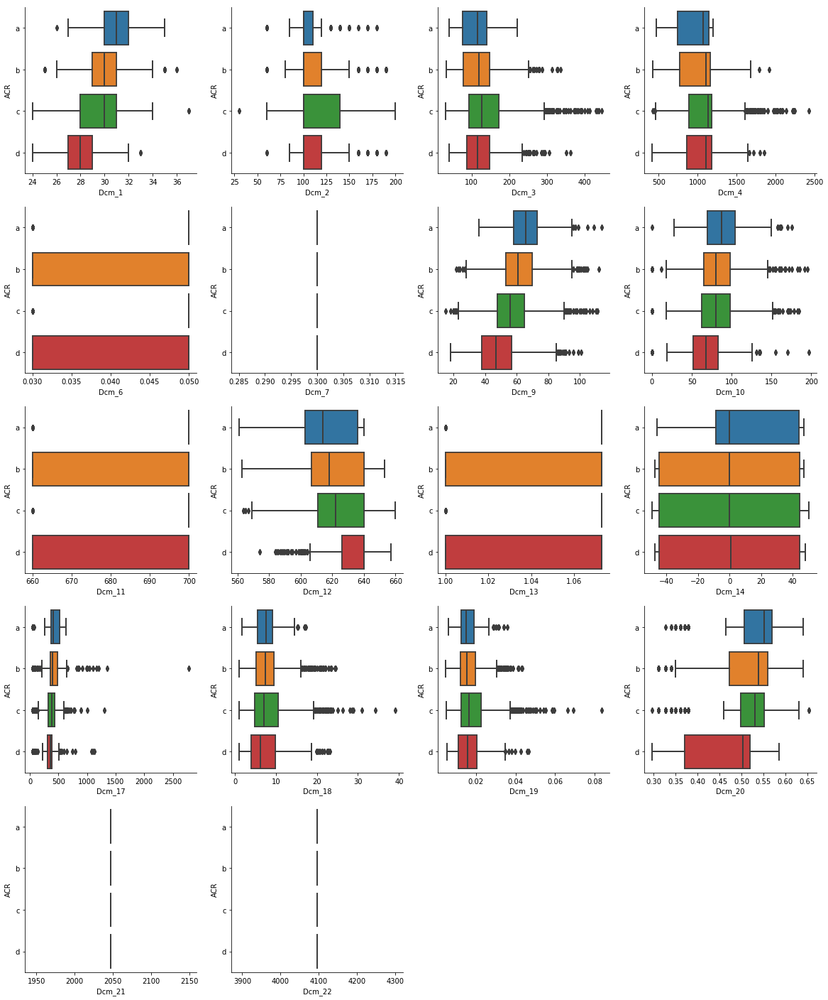

In [19]:
ntot = len(Dicom_features)
ny = 4
nx = int(ntot/ny) + 1

acr_tp = [a_cm,b_cm,c_cm,d_cm]
Names = ["a","b","c", "d"]

f, axes = plt.subplots(nx,ny,figsize=(20,20*nx/ny))

for ax,feature in zip(axes.flat[:ntot],Dicom_features):
    for view,name in zip(acr_tp,Names):
        sns.boxplot(x=feature,data=data,y="ACR", order=["a", "b", "c", "d"], ax=ax)

for ax in axes.flat[ntot:]:
    ax.axis("off")
    
sns.despine()

La características Dcm_1 que se trata sobre el Kilo voltaje pico de salida del generador presenta menor cantidad de outliers en comparación por las demás features y permite distinguir por parámetros estadísticos a las distintas categorías. En contraposición, las Dcm_3, Dcm_4, Dcm_9 y Dcm_10, Dmc_17,Dcm_18 y Dcm_19 presentan mayor cantidad de outliers que deberían ser analizados.

En la variable Dcm_2 (XRCurrent Corriente del tubo de rayos X medida en mili Amperes) podemos notar que es asimétrica ya que la mediana se encuentra en el límite inferior de la caja. 

La variable discreta Dcm_6 adopta dos valores para el espesor del filtro. Algo similar sucede con la Dcm_11 y Dcm_13 que se tratan de la distancia de la fuente al detector en mm y de la estimación de la magnificación, respectivamente. 

Las variables Dcm_7, Dcm_21 y Dcm_22 son monovaluadas y no aportan a la clasificación. Las mimas se refieren, respectivamente al tamaño nominal del punto focal en mm utilizado para adquirir la imagen, a WindowCenter y a WindowWidth. 



/home/marioagustin/MiniConda/envs/diplodatos/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:488: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/marioagustin/MiniConda/envs/diplodatos/lib/python3.6/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


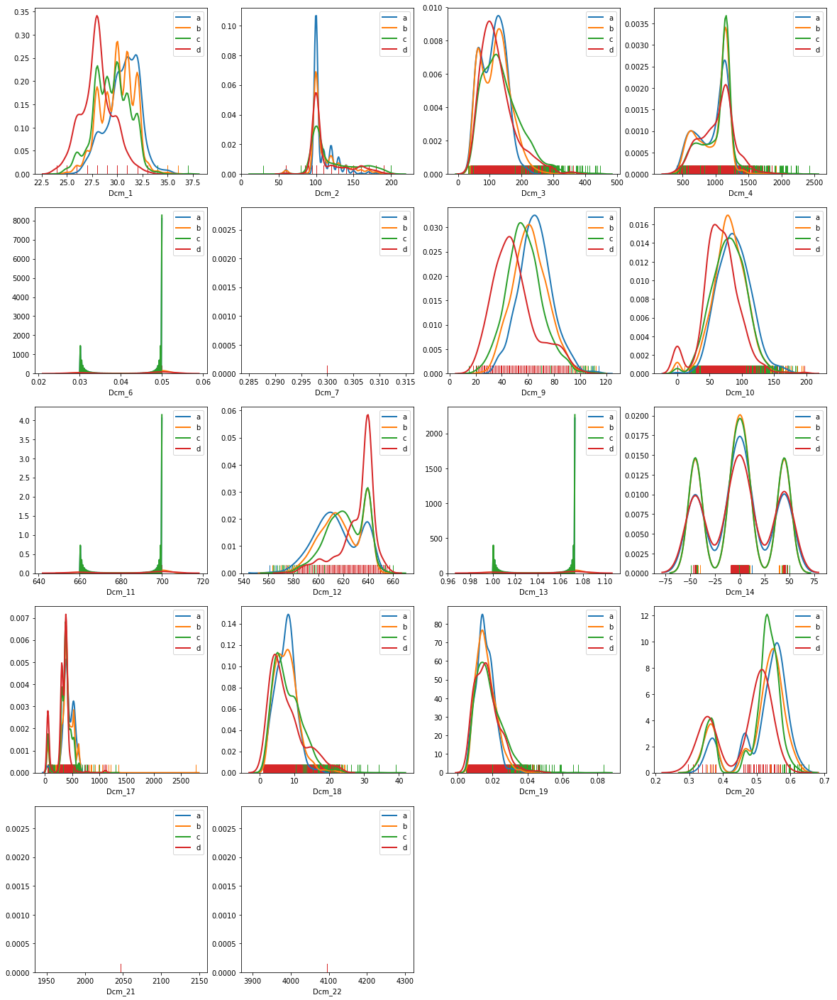

In [20]:
ntot = len(Dicom_features)
ny = 4
nx = int(ntot/ny) + 1

#Views = [CC,MLO,MLOID]
#Names = ["CC","MLO","MLOID"]
acr_tp = [a_cm,b_cm,c_cm,d_cm]
Names = ["a","b","c", "d"]

f, axes = plt.subplots(nx,ny,figsize=(20,20*nx/ny))

for ax,feature in zip(axes.flat[:ntot],Dicom_features):
    _min = data[feature].min()
    _max = data[feature].max()
    for acr,name in zip(acr_tp,Names):
        sns.distplot(data[feature][acr],bins=20,ax=ax,hist=False,rug=True,kde_kws={"lw": 2,"label":name})
        #ax.hist(data[feature][acr],bins=20,density=True,alpha=0.4,label=name,range=(_min,_max),histtype='step')
    
for ax in axes.flat[ntot:]:
    ax.axis("off")


En una primera vista de las columnas correspondientes a las características
DICOM (aquí indicadas como 'Dicom_features'), no aportarían a la clasificación ACR 
las columnas: DCM_6,DCM_7, DCM_11, DCM_13, DCM_21 y DCM_22, debido a que toman un sólo valor para los 4 tipos de mamas.


Siendo la descripción de las mismas:     

    * Dcm_6  --> FilterThickness. 
        Espesor del filtro
    *  Dcm_7  --> FocalSpots.
        Punto focal: Tamaño nominal del punto focal en mm utilizado para adquirir la imagen.
    *  Dcm_11  --> DistanceSourceDetector
        Distancia de la fuente al detector: Distancia en mm desde la fuente hasta el centro del detector
    *  Dcm_13  --> EstimatedMagnification : Estimación de la magnificación
    *  Dcm_21  --> WindowCenter
    *  Dcm_22  --> WindowWidth  


Variables Dicom que presentan valores discretos.

In [22]:
data[["Dcm_1","Dcm_2","Dcm_6","Dcm_7","Dcm_11","Dcm_13","Dcm_21","Dcm_22"]].astype("category").describe()

,Dcm_1,Dcm_2,Dcm_6,Dcm_7,Dcm_11,Dcm_13,Dcm_21,Dcm_22
count,6394.0,6394.0,6394.00,6394.0,6394.0,6394.000,6394.0,6394.0
unique,14.0,17.0,2.00,1.0,2.0,2.000,1.0,1.0
top,30.0,100.0,0.05,0.3,700.0,1.073,2047.0,4096.0
freq,1395.0,3508.0,4833.00,6394.0,4833.0,4833.000,6394.0,6394.0


In [28]:
for feature in ["Dcm_1","Dcm_2","Dcm_6","Dcm_7","Dcm_11","Dcm_13","Dcm_21","Dcm_22"]:
    print(feature,sorted(data[feature].unique()))

Dcm_1 [24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0, 31.0, 32.0, 33.0, 34.0, 35.0, 36.0, 37.0]
Dcm_2 [30.0, 60.0, 80.0, 85.0, 90.0, 95.0, 100.0, 110.0, 120.0, 130.0, 140.0, 150.0, 160.0, 170.0, 180.0, 190.0, 200.0]
Dcm_6 [0.03, 0.05]
Dcm_7 [0.3]
Dcm_11 [660.0, 700.0]
Dcm_13 [1.0, 1.073]
Dcm_21 [2047.0]
Dcm_22 [4096.0]


Aquellas variables discretas que asumen dos valores, quizás podrían categorizarse y tomarse como una binomial, encontrando allí posiblemente su posible potencialidad para discriminar las categorías. 

In [23]:
# Las eliminamos del análisis de la base de datos:
Dicom_features.remove('Dcm_6')
Dicom_features.remove('Dcm_7')
Dicom_features.remove('Dcm_11')
Dicom_features.remove('Dcm_13')
Dicom_features.remove('Dcm_21')
Dicom_features.remove('Dcm_22')
#Se eliminan 6 columnas de DICOM

# Análisis registros Haralick

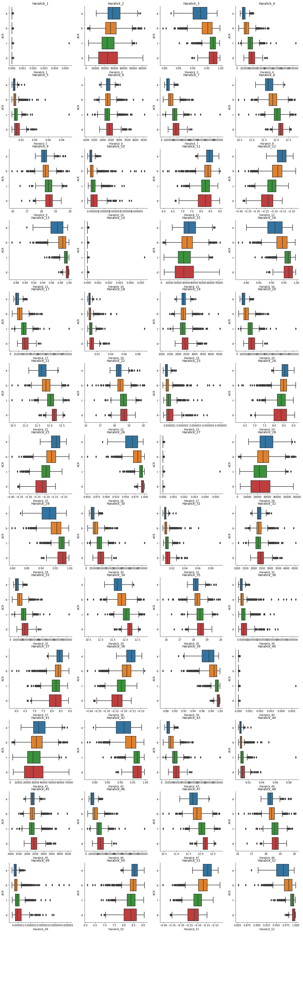

In [23]:
ntot = len(Haralick_features)
ny = 4
nx = int(ntot/ny) + 1

acr_tp = [a_cm,b_cm,c_cm,d_cm]
Names = ["a","b","c", "d"]

f, axes = plt.subplots(nx,ny,figsize=(20,20*nx/ny))

for ax,feature in zip(axes.flat[:ntot],Haralick_features):
    _min = data[feature].min()
    _max = data[feature].max()
    for view,name in zip(acr_tp,Names):
        sns.boxplot(x=feature,data=data,y="ACR", order=["a", "b", "c", "d"],ax=ax)
    ax.set_title(feature)
       
for ax in axes.flat[ntot:]:
    ax.axis("off")
sns.despine()
plt.show()

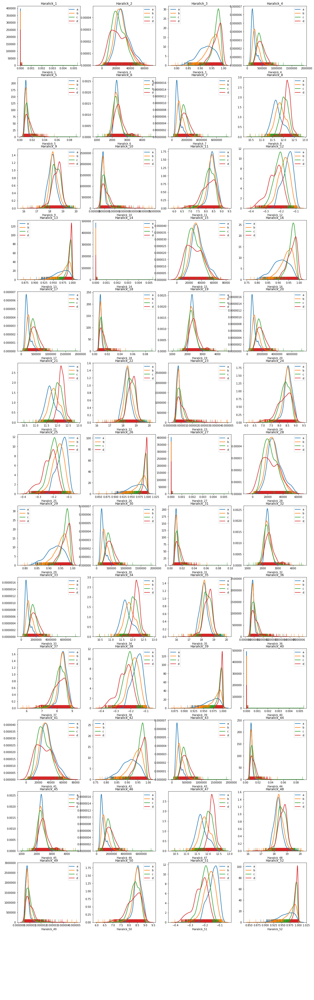

In [24]:
ntot = len(Haralick_features)
ny = 4
nx = int(ntot/ny) + 1

#Views = [CC,MLO,MLOID]
#Names = ["CC","MLO","MLOID"]
acr_tp = [a_cm,b_cm,c_cm,d_cm]
Names = ["a","b","c", "d"]

f, axes = plt.subplots(nx,ny,figsize=(20,20*nx/ny))

for ax,feature in zip(axes.flat[:ntot],Haralick_features):
    _min = data[feature].min()
    _max = data[feature].max()
    for acr,name in zip(acr_tp,Names):
        sns.distplot(data[feature][acr],bins=20,ax=ax,hist=False,rug=True,kde_kws={"lw": 2,"label":name})
        #ax.hist(data[feature][acr],bins=20,density=True,alpha=0.4,label=name,range=(_min,_max))
    ax.set_title(feature)
    ax.legend()

for ax in axes.flat[ntot:]:
    ax.axis("off")
plt.show()

De las columnas correspondientes a las características Haralick 
(las cuales son un conjunto de medidas de textura basadas en la matriz de  niveles de grices, aquí 
 indicadas como 'Haralick_features'),creemos que no aportarían a la clasificación ACR las columnas: 
    Haralick_1  / _14 / _27 / _40 /. (Aunque hay un outlier evidente de tamaño muy superior a los demás,antes de sacar toda la columna, ver si sacándolo, se distinguen las distintas distribuciones.

In [25]:
# Eliminamos dichas columnas del análisis de la base de datos:
Haralick_features.remove('Haralick_1')
Haralick_features.remove('Haralick_14')
Haralick_features.remove('Haralick_27')
Haralick_features.remove('Haralick_40')
#Se eliminan 4 columnas de Haralick 

# Análisis registros DF

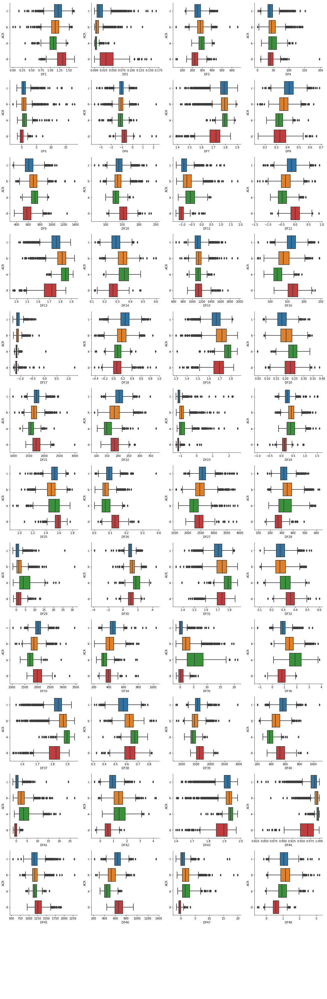

In [28]:
#DF: Características relacionadas a la dimensión fractal de la imagen. 

ntot = len(DF_features)
ny = 4
nx = int(ntot/ny) + 1

acr_tp = [a_cm,b_cm,c_cm,d_cm]
Names = ["a","b","c", "d"]

f, axes = plt.subplots(nx,ny,figsize=(20,20*nx/ny))

for ax,feature in zip(axes.flat[:ntot],DF_features):
    _min = data[feature].min()
    _max = data[feature].max()
    for view,name in zip(acr_tp,Names):
        sns.boxplot(x=feature,data=data,y="ACR",ax=ax)


for ax in axes.flat[ntot:]:
    ax.axis("off")
sns.despine()

plt.show()

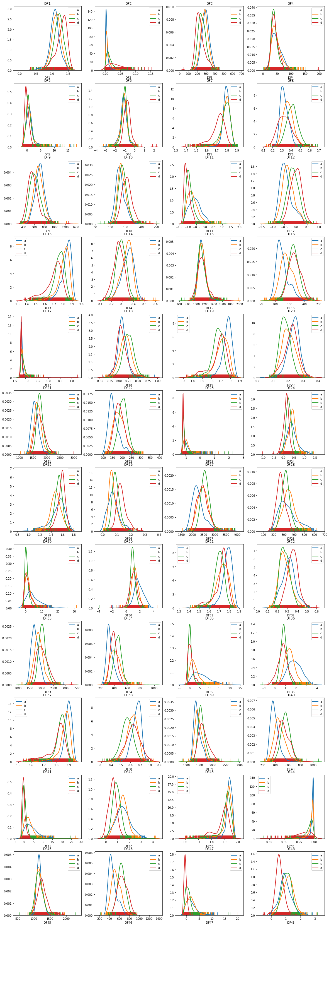

In [29]:
ntot = len(DF_features)
ny = 4
nx = int(ntot/ny) + 1

#Views = [CC,MLO,MLOID]
#Names = ["CC","MLO","MLOID"]
acr_tp = [a_cm,b_cm,c_cm,d_cm]
Names = ["a","b","c", "d"]

f, axes = plt.subplots(nx,ny,figsize=(20,20*nx/ny))

for ax,feature in zip(axes.flat[:ntot],DF_features):
    _min = data[feature].min()
    _max = data[feature].max()
    for acr,name in zip(acr_tp,Names):
        sns.distplot(data[feature][acr],bins=20,ax=ax,hist=False,rug=True,kde_kws={"lw": 2,"label":name})
        #ax.hist(data[feature][acr],bins=20,density=True,alpha=0.4,label=name,range=(_min,_max))
    ax.set_title(feature)
    ax.legend()

for ax in axes.flat[ntot:]:
    ax.axis("off")

plt.show()

Decidimos conservar todas las columnas correspondientes a las características relacionadas a la dimensión fractal de la imagen (denotada como DF en la database).

# Análisis registros DFb

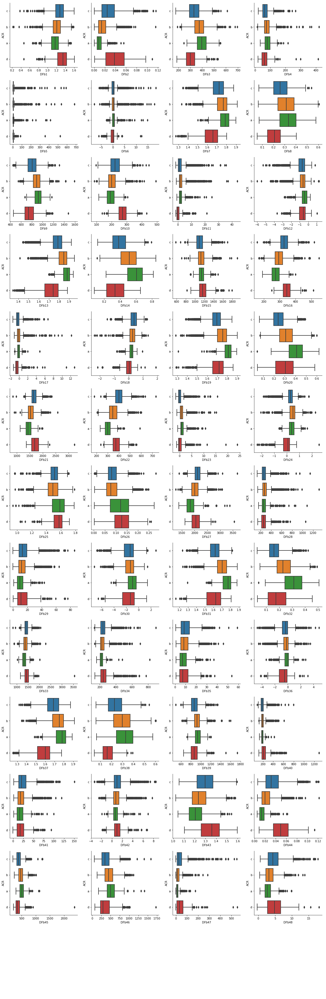

In [31]:
#DFb: Características relacionadas a la dimensi´on fractal de los bordes de la imagen.
ntot = len(DFb_features)
ny = 4
nx = int(ntot/ny) + 1

acr_tp = [a_cm,b_cm,c_cm,d_cm]
Names = ["a","b","c", "d"]

f, axes = plt.subplots(nx,ny,figsize=(20,20*nx/ny))

for ax,feature in zip(axes.flat[:ntot],DFb_features):
    _min = data[feature].min()
    _max = data[feature].max()
    for view,name in zip(acr_tp,Names):
        sns.boxplot(x=feature,data=data,y="ACR",ax=ax)

for ax in axes.flat[ntot:]:
    ax.axis("off")
sns.despine()
plt.show()

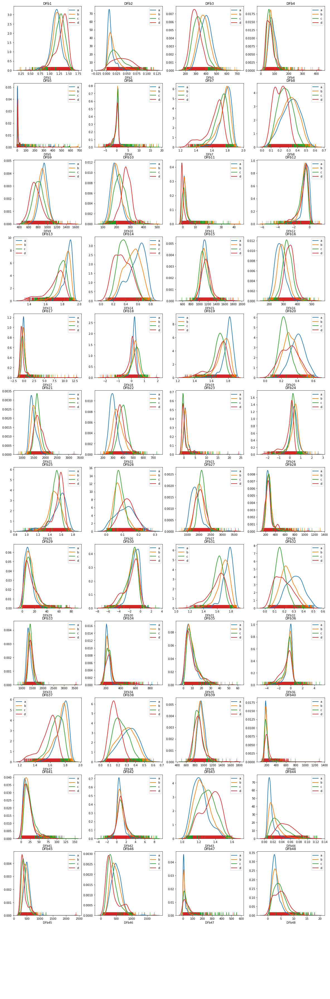

In [32]:
ntot = len(DFb_features)
ny = 4
nx = int(ntot/ny) + 1

#Views = [CC,MLO,MLOID]
#Names = ["CC","MLO","MLOID"]
acr_tp = [a_cm,b_cm,c_cm,d_cm]
Names = ["a","b","c", "d"]

f, axes = plt.subplots(nx,ny,figsize=(20,20*nx/ny))

for ax,feature in zip(axes.flat[:ntot],DFb_features):
    _min = data[feature].min()
    _max = data[feature].max()
    for acr,name in zip(acr_tp,Names):
        sns.distplot(data[feature][acr],bins=20,ax=ax,hist=False,rug=True,kde_kws={"lw": 2,"label":name})
        #ax.hist(data[feature][acr],bins=20,density=True,alpha=0.4,label=name,range=(_min,_max))
    ax.set_title(feature)
    ax.legend()

for ax in axes.flat[ntot:]:
    ax.axis("off")
plt.show()

Decidimos conservar todas las columnas correspondientes a las características relacionadas a la dimensión 
fractal de los bordes de la imagen(denotada como DFb en la database). 


In [ ]:
#DFb_features.remove('DFb5') # o si?
#DFb_features.remove('DFb6') # o si?
#tienen muchos outliers, no nos decidimos si descartarlas dichas columnas

# Análisis otros registros

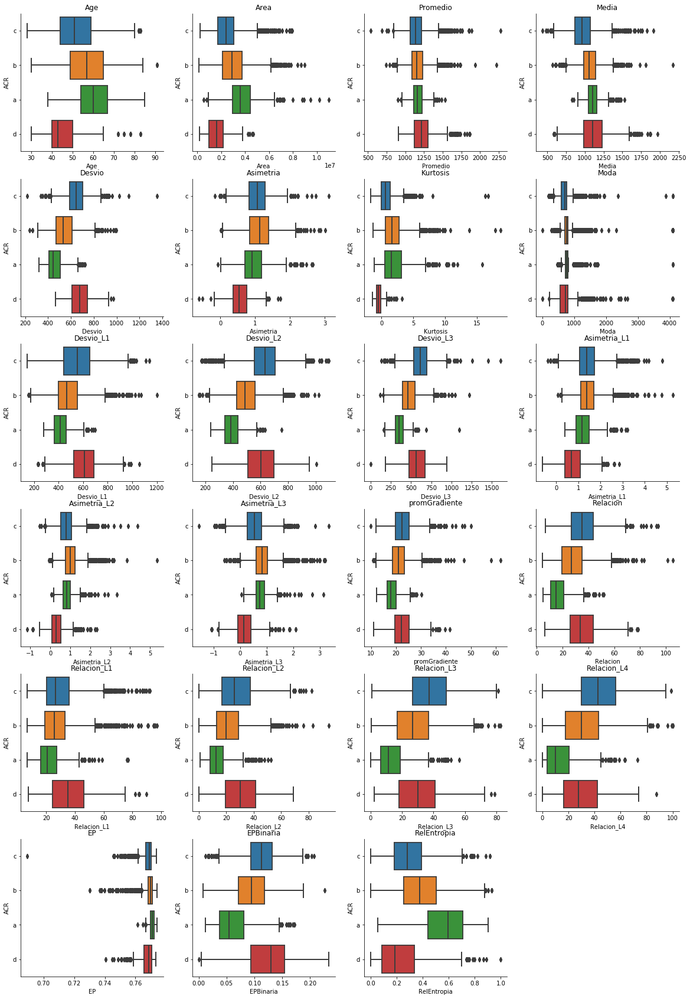

In [33]:
ntot = len(Others_features)
ny = 4
nx = int(ntot/ny) + 1

acr_tp = [a_cm,b_cm,c_cm,d_cm]
Names = ["a","b","c", "d"]

f, axes = plt.subplots(nx,ny,figsize=(20,20*nx/ny))

for ax,feature in zip(axes.flat[:ntot],Others_features):
    _min = data[feature].min()
    _max = data[feature].max()
    for view,name in zip(acr_tp,Names):
        sns.boxplot(x=feature,data=data,y="ACR",ax=ax)
    ax.set_title(feature)
       
for ax in axes.flat[ntot:]:
    ax.axis("off")
sns.despine()

plt.show()

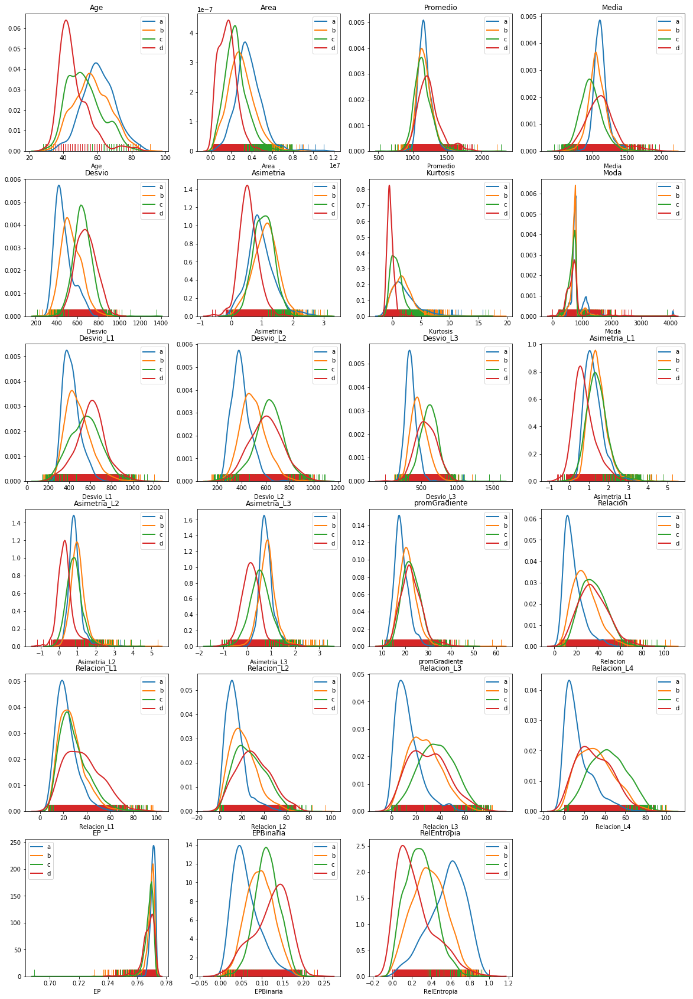

In [34]:
ntot = len(Others_features)
ny = 4
nx = int(ntot/ny) + 1

#Views = [CC,MLO,MLOID]
#Names = ["CC","MLO","MLOID"]
acr_tp = [a_cm,b_cm,c_cm,d_cm]
Names = ["a","b","c", "d"]

f, axes = plt.subplots(nx,ny,figsize=(20,20*nx/ny))

for ax,feature in zip(axes.flat[:ntot],Others_features):
    _min = data[feature].min()
    _max = data[feature].max()
    for acr,name in zip(acr_tp,Names):
        sns.distplot(data[feature][acr],bins=20,ax=ax,hist=False,rug=True,kde_kws={"lw": 2,"label":name})
        #ax.hist(data[feature][acr],bins=20,density=True,alpha=0.4,label=name,range=(_min,_max))
    ax.set_title(feature)
    ax.legend()

for ax in axes.flat[ntot:]:
    ax.axis("off")
    
plt.show()

Decidimos conservar todas las columnas correspondientes a las características restantes, denotadas como 'Others_features'

 Luego de un primer análisis exploratorio de las variables numéricas, mediante histogramas y diagramas de caja, descartamos 10 columnas (6 de características DICOM y 4 de Haralick) ya que las mismas eran mono-valuadas y por lo tanto no aportarían a la clasificación. 



**2-Describir el tipo de las variables presentes en la base, analizar su distribución e identificarlas si es posible.**

Comenzaremos el análisis por conjunto de datos:

**Características DICOM**

 * Dcm_1  --> KVP 
 Kilo voltaje pico de salida del generador. 

 * Dcm_2  --> XRCurrent 
 Corriente del tubo de rayos X medida en mili Amperes.

 * Dcm_3  --> Exposure 
 Exposición: Corriente del tubo de rayos X medida en mili Amperes por segundo.

 * Dcm_4 --> ExposureTime 
Tiempo de exposición: Duración de la exposición a los rayos X medida en mili segundos.

 * Dcm_5  --> FilterMaterial 
Material del filtro: • Plata • Aluminio • Molibdeno • Rodio

* Dcm_6  --> FilterThickness 
Espesor del filtro

* Dcm_7  --> FocalSpots 
Punto focal: Tamañoo nominal del punto focal en mm utilizado para adquirir la imagen.

* Dcm_8  --> AnodeTargetMaterial
Material del blanco del ´anodo:Puede estar construido de: • Tungsteno • Molibdeno • Rodio

* Dcm_9  --> BodyPartThickness 
Espesor de la mama: El grosor promedio en mm de la parte del cuerpo examinada cuando se comprime, si se ha aplicado compresión durante la exposición.

* Dcm_10 --> CompressionForce 
Fuerza de compresión: La fuerza de compresión aplicada a la parte del cuerpo durante la exposición, medida en Newtons

* Dcm_11  --> DistanceSourceDetector 
Distancia de la fuente al detector: Distancia en mm desde la fuente hasta el centro del detector

* Dcm_12  --> DistanceSourcePatient 
Distancia de la fuente al paciente

* Dcm_13  --> EstimatedMagnification 
Estimación de la magnificación


* Dcm_14  --> PositionerPrimaryAngle 
Angulación primaria del posicionador: Distancia en mm desde la fuente hasta la mesa, el lado de apoyo más cercano al sujeto de imagen, medido a lo largo del rayo central del haz de rayos X.

* Dcm_15  --> ExposureControlMode  
Modo de control de la exposición: Existen tres posibles configuraciones: • Automático. • Autofiltrado. • Manual.

* Dcm_16  --> ExposureControlModeDescrip 
Descripción del modo de control de la exposición

* Dcm_17  --> RelativeXRExposure 
Exposición relativa a los rayos X.

* Dcm_18  --> EntranceDoseInmGy  
Dosis de entrada: El valor medio de la dosis de entrada medido en mili Gray en la superficie del paciente durante la adquisici´on de esta imagen.

* Dcm_19  --> OrganDose 
Dosis que recibe el órgano expuesto a la radiación: Valor medio de la dosis en el órgano medido en deciGray durante la adquisición de esta imagen.

* Dcm_20  --> HalfValueLayer 
Capa de valor medio: Grosor del aluminio en mm requerido para reducir la salida de rayos X en un factor de dos.

* Dcm_21  --> WindowCenter 
* Dcm_21  --> WindowWidth  

* Dcm_2  --> BreastImplantPresent 
Presencia de implante mamario: Puede tomar dos valores: • Sí. • No.






In [ ]:
#Características DICOM
ntot = len(Dicom_features)
ny = 4
nx = int(ntot/ny) + 1

#Views = [CC,MLO,MLOID]
#Names = ["CC","MLO","MLOID"]
acr_tp = [a_cm,b_cm,c_cm,d_cm]
Names = ["a","b","c", "d"]

f, axes = plt.subplots(nx,ny,figsize=(20,20*nx/ny))

for ax,feature in zip(axes.flat[:ntot],Dicom_features):
    _min = data[feature].min()
    _max = data[feature].max()
    for acr,name in zip(acr_tp,Names):
        ax.hist(data[feature][acr],bins=20,density=True,alpha=0.4,label=name,range=(_min,_max))
    ax.set_title(feature)
    ax.legend()

for ax in axes.flat[ntot:]:
    ax.axis("off")
plt.show()

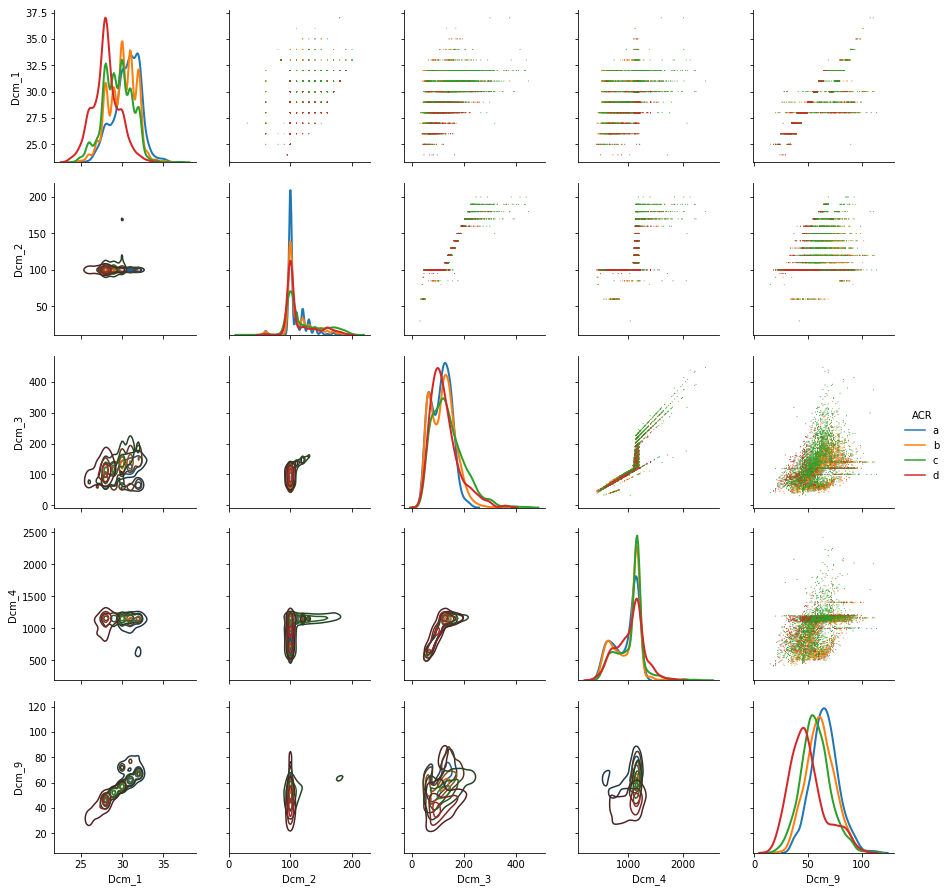

In [38]:
DC1 = Dicom_features[:5]
DC1.append('ACR')

#sns.pairplot(data[DC1],hue='ACR',markers='.',plot_kws=dict(edgecolor="None",linewidth=1),hue_order=["a","b","c","d"])
#sns.despine()

g = sns.PairGrid(data[DC1],hue='ACR',hue_order=["a","b","c","d"],despine=True,diag_sharey=False)
g.map_upper(plt.scatter,s=1,edgecolors='None')
g.map_lower(sns.kdeplot,n_levels=3)
g.map_diag(sns.kdeplot, lw=2, legend=False)
g.add_legend()
sns.despine()

DC1 contiene las columnas ['Dcm_1', 'Dcm_2', 'Dcm_3', 'Dcm_4', 'Dcm_6', 'ACR']. 

KVP  --> Dcm_1
Kilo voltaje pico de salida del generador. 

XRCurrent  --> Dcm_2
Corriente del tubo de rayos X medida en mili Amperes.

Exposure  --> Dcm_3
Exposición: Corriente del tubo de rayos X medida en mili Amperes por segundo.

ExposureTime  --> Dcm_4
Tiempo de exposición: Duración de la exposición a los rayos X medida en mili segundos.


BodyPartThickness  --> Dcm_9
Espesor de la mama: El grosor promedio en mm de la parte del cuerpo examinada cuando se comprime, si se ha aplicado compresión durante la exposición.



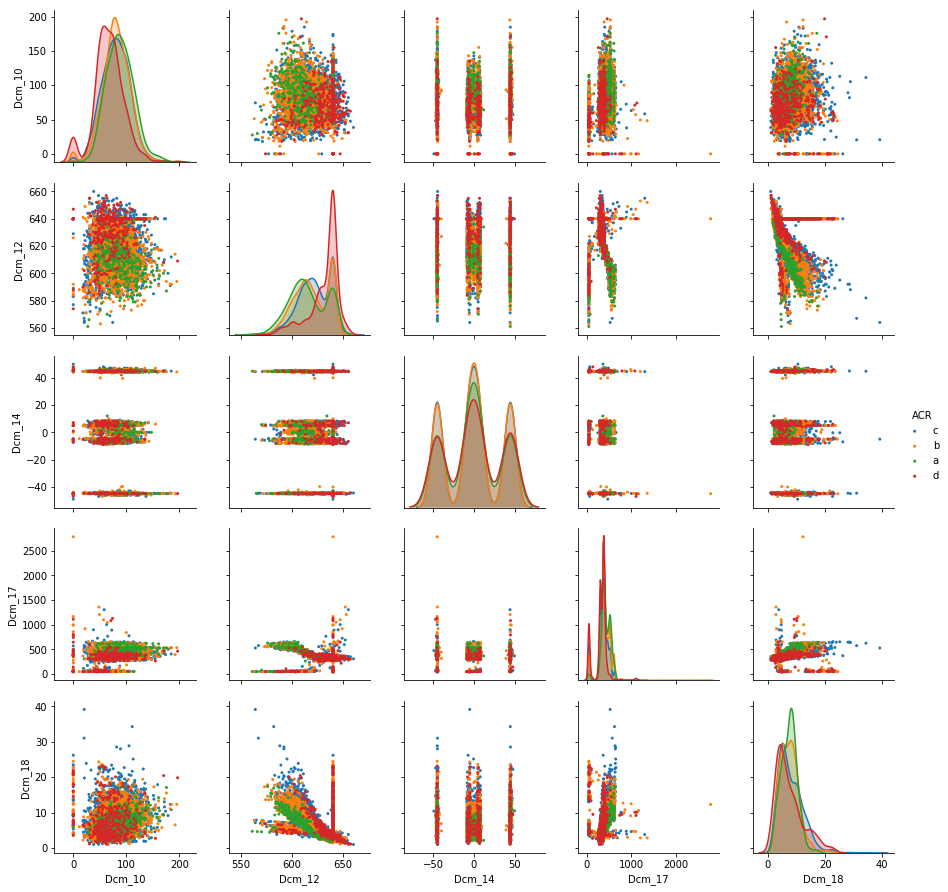

In [44]:
DC2 = Dicom_features[5:10]
DC2.append('ACR')
sns.pairplot(data[DC2],hue='ACR',markers='.',plot_kws=dict(edgecolor="None",linewidth=1))
sns.despine()

DC2 contiene las columnas ['Dcm_10', 'Dcm_12', 'Dcm_14', 'Dcm_17', 'Dcm_18', 'ACR']

CompressionForce  --> Dcm_10
Fuerza de compresión: La fuerza de compresión aplicada a la parte del cuerpo durante la exposición, medida en Newtons

DistanceSourcePatient  --> Dcm_12
Distancia de la fuente al paciente

PositionerPrimaryAngle  --> Dcm_14
Angulación primaria del posicionador: Distancia en mm desde la fuente hasta la mesa, el lado de apoyo más cercano al sujeto de imagen, medido a lo largo del rayo central del haz de rayos X.

RelativeXRExposure  --> Dcm_17
Exposición relativa a los rayos X.

EntranceDoseInmGy  --> Dcm_18
Dosis de entrada: El valor medio de la dosis de entrada medido en mili Gray en la superficie del paciente durante la adquisición de esta imagen.



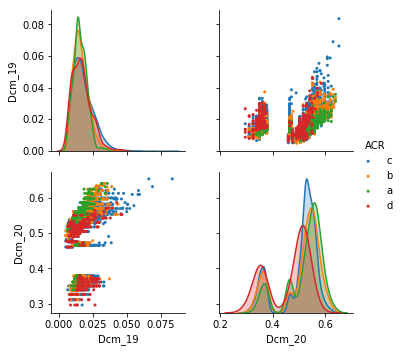

In [43]:
DC3 = Dicom_features[10:15]
DC3.append('ACR')
sns.pairplot(data[DC3],hue='ACR',markers='.',plot_kws=dict(edgecolor="None",linewidth=1))
sns.despine()

DC3 contiene ['Dcm_19', 'Dcm_20', 'ACR']

OrganDose  --> Dcm_19
Dosis que recibe el órgano expuesto a la radiación: Valor medio de la dosis en el órgano medido en deci Gray durante la adquisición de esta imagen.

HalfValueLayer  --> Dcm_20
Capa de valor medio: Grosor del aluminio en mm requerido para reducir la salida de rayos X en un factor de dos.






Del conjunto DC1, la que mejor nos permite distinguir las cuatro clases es la Dcm_9 que se refiere al 
espesor de la mama y se observa una posible correlación positiva con las demás columnas, siendo la mas 
evidente por tramos con Dcm_1 que se refiere al Kilo voltaje pico de salida del generador. 

Las variables Dcm_2, Dcm_3 y Dcm_4, a nivel exploratorio no permiten distinguir entre las 4 
categorías de 'ACR' y además se observa una correlación positiva por tramos, las cuales se refieren 
a la exposicion de rayosX. 

Del conjunto DC2, la Dcm_17 que es la correspondiente a la exposición relativa a los RX no 
permite una posible separación entre las clases. La variable Dcm_14 que se refiere al ángulo del posicionador 
y habría que ver si se observa correlación con la columna "View".

Del conjunto DC3, la Dcm_20 que se refiere al grosor del alumnio presenta una distribución bimodal y 
permite distinguir las  categorías "ACR".


**Haralick**

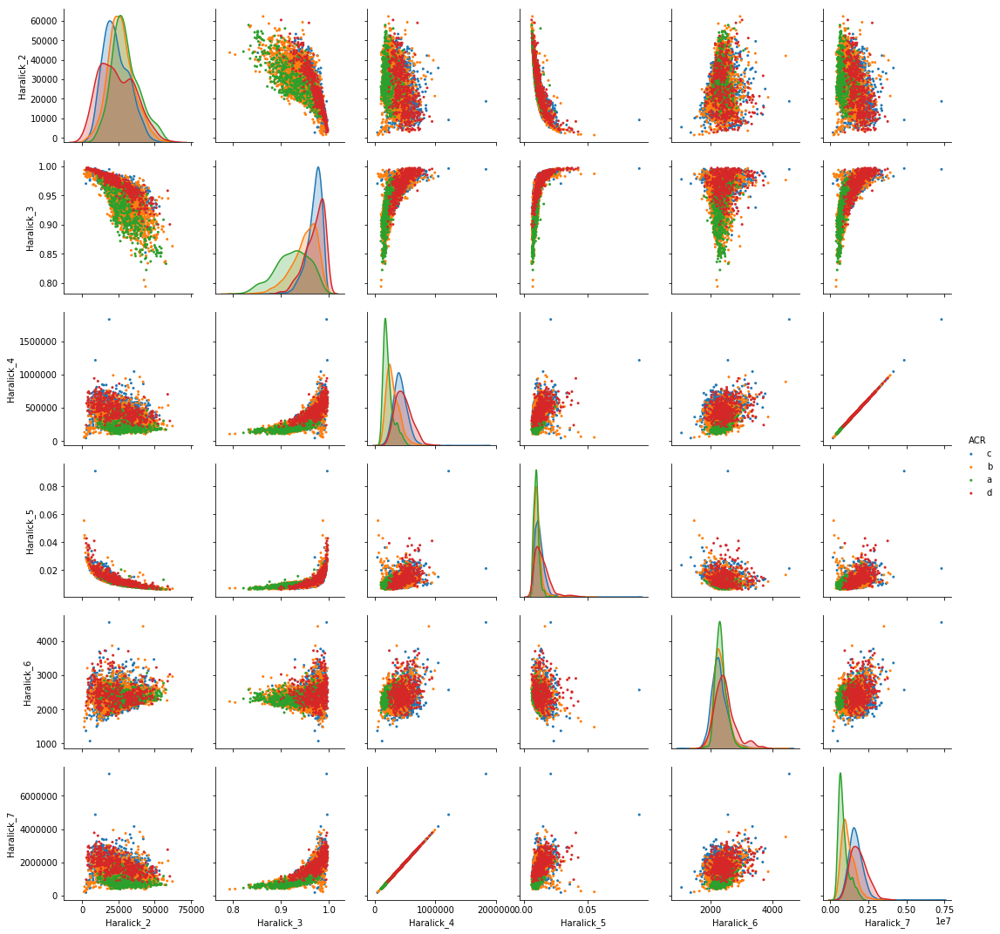

In [41]:
HR1 = Haralick_features[0:6]
HR1.append('ACR')
sns.pairplot(data[HR1],hue='ACR',markers='.',plot_kws=dict(edgecolor="None",linewidth=1))
sns.despine()

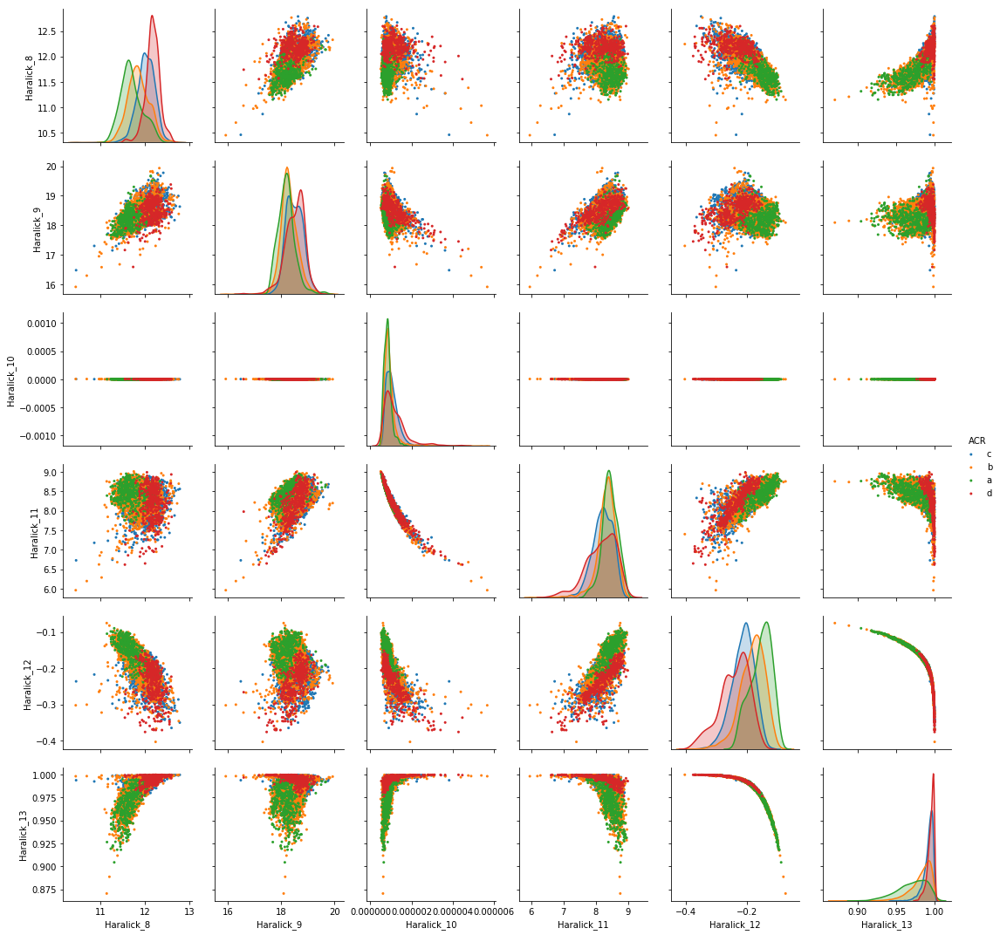

In [42]:
HR2 = Haralick_features[6:12]
HR2.append('ACR')
sns.pairplot(data[HR2],hue='ACR', markers='.',plot_kws=dict(edgecolor="None",linewidth=1))
sns.despine()


In [ ]:
#Se corresponde con HR1
#HR3 = Haralick_features[12:18]
#HR3.append('ACR')
#sns.pairplot(data[HR3],hue='ACR',markers='.',plot_kws=dict(edgecolor="None",linewidth=1))
#sns.despine()

In [ ]:
#Se corresponde con HR2
#HR4 = Haralick_features[18:24]
#HR4.append('ACR')
#sns.pairplot(data[HR4],hue='ACR',markers='.',plot_kws=dict(edgecolor="None",linewidth=1))
#sns.despine()

In [ ]:
#Se corresponde con HR1
#HR5 = Haralick_features[24:30]
#HR5.append('ACR')
#sns.pairplot(data[HR5],hue='ACR',markers='.',plot_kws=dict(edgecolor="None",linewidth=1))
#sns.despine()

In [ ]:
#Se corresponde con HR2
#HR6 = Haralick_features[30:36]
#HR6.append('ACR')
#sns.pairplot(data[HR6],hue='ACR',markers='.',plot_kws=dict(edgecolor="None",linewidth=1))
#sns.despine()

In [ ]:
#Se corresponde con HR1
#HR7 = Haralick_features[36:42]
#HR7.append('ACR')
#sns.pairplot(data[HR7],hue='ACR',markers='.',plot_kws=dict(edgecolor="None",linewidth=1))
#sns.despine()

In [ ]:
##Se corresponde con HR2
#HR8 = Haralick_features[42:48]
#HR8.append('ACR')
#sns.pairplot(data[HR8],hue='ACR',markers='.',plot_kws=dict(edgecolor="None",linewidth=1))
#sns.despine()

Se observa las mismas distribuciones para los valores observados de cada una de las 13 Haralick tomadas de los 
distintos ángulos. En términos generales, las 13 imágenes sirven para lograr una clasficación de clases.

Por lo cual sólo describiremos de forma aproximada las representaciones de 13 de ellas:

-Las columnas Haralick_1, Haralick_14, Haralik_27 y Haralick_40 fueron descartadas
ya que presentaban un solo valor, que nos indicaba un monovalor. Siendo su valor valor bajo un índice que 
todas las entradas eran similares.
    
Las Haralick 4,5,6,7,10 y todas sus repeticiones permiten asignar mayor preponderancia a las mamas mas 
adiposas (tipo a).





In [46]:
ntot = len(DF_features)
ny = 4
nx = int(ntot/ny) + 1

Views = [CC,MLO,MLOID]
Names = ["CC","MLO","MLOID"]

f, axes = plt.subplots(nx,ny,figsize=(20,20*nx/ny))

for ax,feature in zip(axes.flat[:ntot],DF_features):
    _min = data[feature].min()
    _max = data[feature].max()
    for view,name in zip(Views,Names):
        ax.hist(data[view][feature],bins=20,density=True,alpha=0.4,label=name,range=(_min,_max))
    ax.set_title(feature)
    ax.legend()

for ax in axes.flat[ntot:]:
    ax.axis("off")

NameError: name 'CC' is not defined

**Dimensión Fractal (DF)**

In [ ]:
DF1 = DF_features[0:6]
DF1.append('ACR')
sns.pairplot(data[DF1],hue='ACR',markers='.',plot_kws=dict(edgecolor="None",linewidth=1))
sns.despine()

In [ ]:
DF2 = DF_features[6:12]
DF2.append('ACR')
sns.pairplot(data[DF2],hue='ACR',markers='.',plot_kws=dict(edgecolor="None",linewidth=1))
sns.despine()

In [ ]:
DF3 = DF_features[12:18]
DF3.append('ACR')
sns.pairplot(data[DF3],hue='ACR',markers='.',plot_kws=dict(edgecolor="None",linewidth=1))
sns.despine()

In [ ]:
DF3 = DF_features[18:24]
DF3.append('ACR')
sns.pairplot(data[DF3],hue='ACR',markers='.',plot_kws=dict(edgecolor="None",linewidth=1))
sns.despine()

In [ ]:
DF4 = DF_features[24:30]
DF4.append('ACR')
sns.pairplot(data[DF4],hue='ACR',markers='.',plot_kws=dict(edgecolor="None",linewidth=1))
sns.despine()

In [ ]:
DF5 = DF_features[30:35]
DF5.append('ACR')
sns.pairplot(data[DF5],hue='ACR',markers='.',plot_kws=dict(edgecolor="None",linewidth=1))
sns.despine()

In [ ]:
DF6 = DF_features[35:42]
DF6.append('ACR')
sns.pairplot(data[DF6],hue='ACR',markers='.',plot_kws=dict(edgecolor="None",linewidth=1))
sns.despine()

In [ ]:
DF7 = DF_features[42:48]
DF7.append('ACR')
sns.pairplot(data[DF7],hue='ACR',markers='.',plot_kws=dict(edgecolor="None",linewidth=1))
sns.despine()

**Dimensión Fractal de bordes**

In [ ]:
DFb1 = DFb_features[0:6]
DFb1.append('ACR')
sns.pairplot(data[DFb1],hue='ACR',markers='.',plot_kws=dict(edgecolor="None",linewidth=1))
sns.despine()

In [ ]:
DFb2 = DFb_features[6:12]
DFb2.append('ACR')
sns.pairplot(data[DFb2],hue='ACR',markers='.',plot_kws=dict(edgecolor="None",linewidth=1))
sns.despine()

In [ ]:
DFb3 = DFb_features[12:18]
DFb3.append('ACR')
sns.pairplot(data[DFb3],hue='ACR',markers='.',plot_kws=dict(edgecolor="None",linewidth=1))
sns.despine()

In [ ]:
DFb4 = DFb_features[18:24]
DFb4.append('ACR')
sns.pairplot(data[DFb4],hue='ACR',markers='.',plot_kws=dict(edgecolor="None",linewidth=1))
sns.despine()

In [ ]:
DFb5 = DFb_features[24:30]
DFb5.append('ACR')
sns.pairplot(data[DFb5],hue='ACR',markers='.',plot_kws=dict(edgecolor="None",linewidth=1))
sns.despine()

In [ ]:
DFb6 = DFb_features[30:36]
DFb6.append('ACR')
sns.pairplot(data[DFb6],hue='ACR',markers='.',plot_kws=dict(edgecolor="None",linewidth=1))
sns.despine()

In [ ]:
DFb7 = DFb_features[36:42]
DFb7.append('ACR')
sns.pairplot(data[DFb7],hue='ACR',markers='.',plot_kws=dict(edgecolor="None",linewidth=1))
sns.despine()

In [ ]:
DFb8 = DFb_features[42:48]
DFb8.append('ACR')
sns.pairplot(data[DFb8],hue='ACR',markers='.',plot_kws=dict(edgecolor="None",linewidth=1))
sns.despine()

In [ ]:
De las dimensiones fractales, tanto las generales como las del borde (DFb) permiten distinguir entre cases en su mayoría. Creemos que no aportan a la separación de los casos las columnas DF_15, DF_17 y DF_23, mientrass que de las correspondientes a las DFb creemos que son las DFb_5, DFb_6, DFb_11, DFb_12, DFb_17, DFb_23, DFb_28 al 30,
DFb_33 al DFb_36, DFb_40 al DFb_42, DFb_45 y DFb_47.     
    

**Otras caraterísticas (Others_features)**

Los datos correspondientes al *Histograma global* son: 'Promedio', 'Media', 'Mediana', 'Desviación estándar', 
    'Asimetría', 'Kurtosis' y 'Moda' .
    
Los datos correspondientes al *Histograma local* serán 'desviación estándar' y 'asimetría' de las 3 partes centrales (la del 40 %, el 70% y el 90 %, denotadas como  (L1, L2 y L3), que son las columnas
'Desvío_L1', 'Desvío_L2','Desvío_L3' y 'Asimetría_L1','Asimetría_L2' y 'Asimetría_L3'
    
    
Cuando se aplica el operador gradiente a una imagen, este devuelve otra que puede ser analizada
de la misma manera (columna 'promGradiente': una característica que representa el promedio de niveles de grises de la imagen gradiente).


Por otro lado luego de visualizar las imágenes umbralizadas, se observó que si se las divide en
porciones como en el análisis anterior y se calculan las relaciones entre píxeles blancos y totales de esa región particular, se obtendrán valores que pueden resultar significativos para la clasificación
(Relación 20/40/70/90  -> Relación L_1/L2_/L_3/L_4).

Entropía de permutaciones (EP) (la calcularon por [31?] ) Luego de aplicar este algoritmo a varias imágenes se ha notado que no hay mucha variaci´on en los valores obtenidos según sea la clase de mamografía. Sin embargo, de este análisis surgió la idea de calcular la entropía de permutaciones a la imagen que resulta de aplicar el gradiente (asumo EP) y umbralización (asumimos EPbinaria).

También  se analizó la relación entre la cantidad de celdas en las cuales su entropía resultó igual a cero y la cantidad de celdas totales analizadas (Asumimos RelEntropia)
    


En la característica 'Age' se distinguen bien las clases, siendo evidente que la clasificación 'd' es 
para mujeres mas jóvenes, mientras que las mamas tipo 'a' son de mujeres mayores. 
Para el área, se encuentra el mismo comportamiento pero con menor dispersión.
El promedio no permite una clara clasificación.
En la media estimada, los valores medias mas elevados se relacionan para 'b' y 'a'.
El Desvío permite una clasificación, siendo las mamas tipo 'a' las que presentan mayor frecuencia.
Para la Asimetría y Kurtosis, se observa un comportamiento análogo a este último descripto pero en las tipo 'd'.
Todas las clases tienen una moda similar, por lo cual no permite una clara clasificación. 

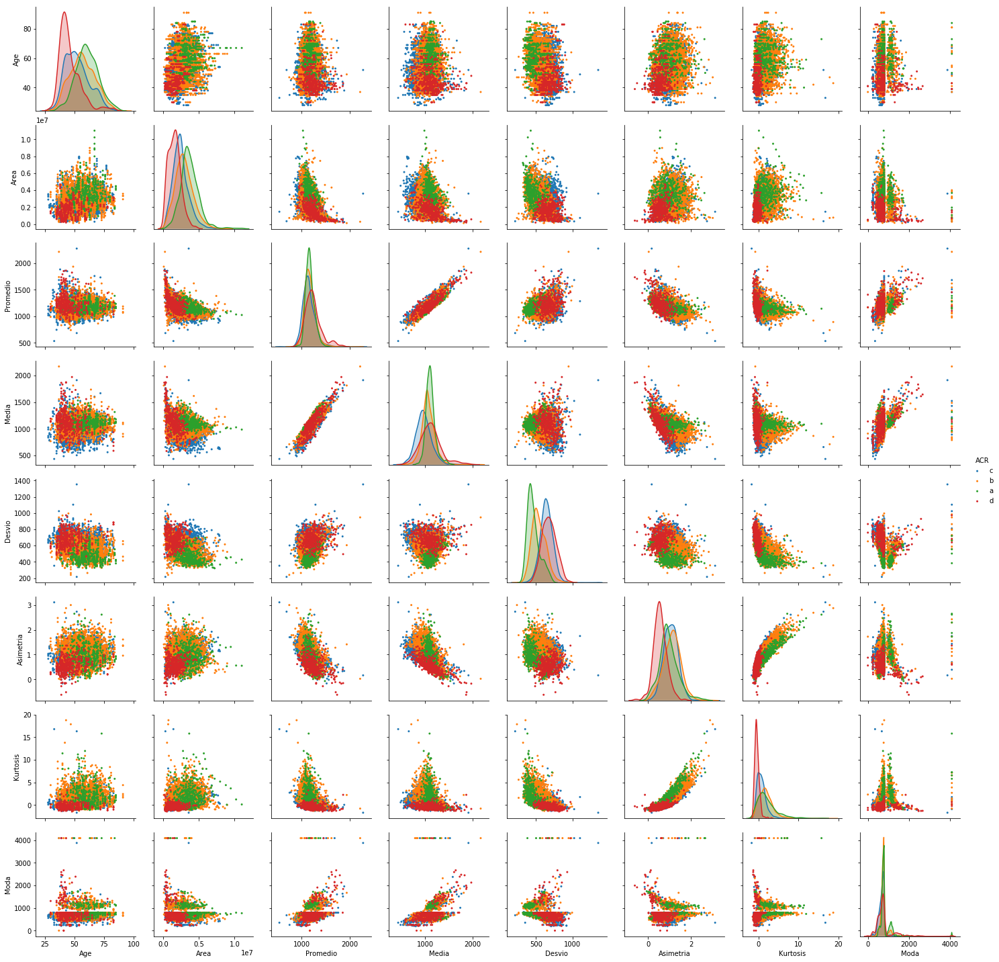

In [47]:
OF1 = Others_features[0:8]
OF1.append('ACR')
sns.pairplot(data[OF1],hue='ACR',markers='.',plot_kws=dict(edgecolor="None",linewidth=1))
sns.despine()

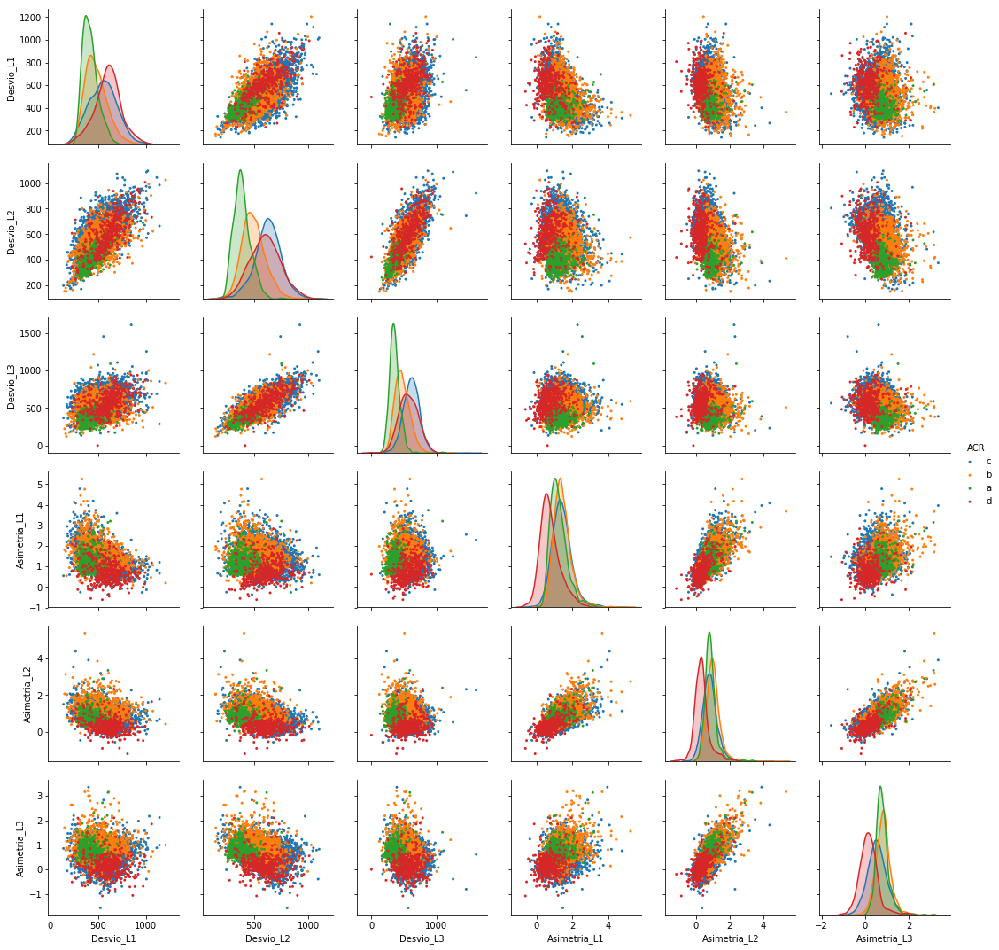

In [48]:
OF2 = Others_features[8:14]
OF2.append('ACR')
sns.pairplot(data[OF2],hue='ACR',markers='.',plot_kws=dict(edgecolor="None",linewidth=1))
sns.despine()

De las columnas promGradiente y Relación (y también las L1,L2,L3 y L4), 
se tiene una gran cantidad de mamas tipo 'c', por lo cual dicha clase está mejor descripta a partir de estas características


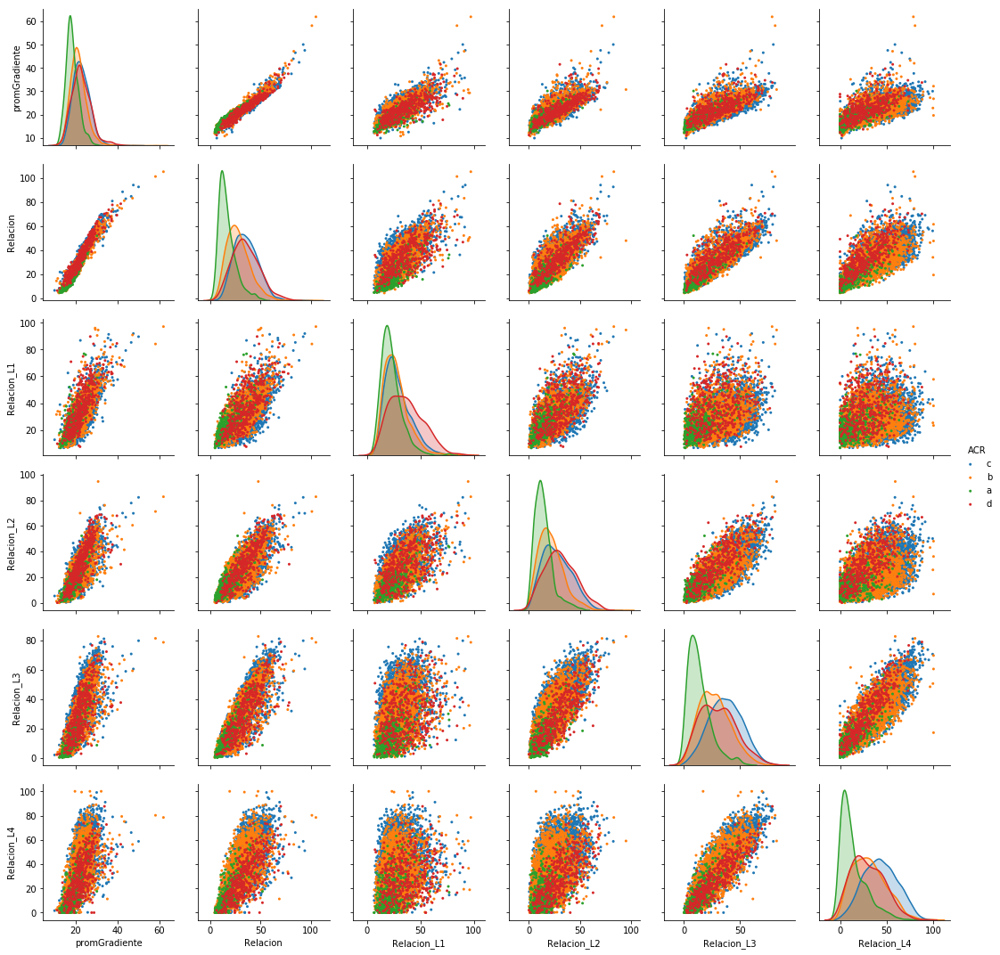

In [49]:
OF3 = Others_features[14:20]
OF3.append('ACR')
sns.pairplot(data[OF3],hue='ACR',markers='.',plot_kws=dict(edgecolor="None",linewidth=1))
sns.despine()

De la Entropía de Permutación (EP) no podemos distinguir claramente ninguna de las clases. 
Pero de la imagen binarizada (EPBinaria) y de la RealEntropía si se logra una definición de tipos de mamas.

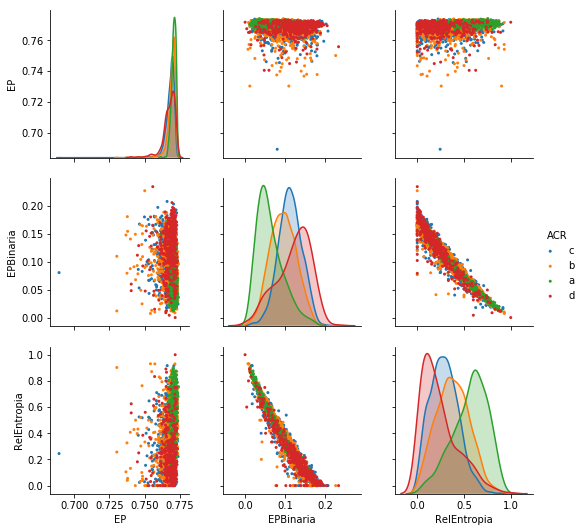

In [50]:
OF4 = Others_features[20:26]
OF4.append('ACR')
sns.pairplot(data[OF4],hue='ACR',markers='.',plot_kws=dict(edgecolor="None",linewidth=1))
sns.despine()

In [ ]:
#All_features = [x for x in data.columns if data[x].dtypes == 'float64']
#Dicom_features = [x for x in data.columns if ('Dcm_' in x and data[x].dtypes == 'float64')]
#Haralick_features = [x for x in data.columns if ('Haralick_' in x and data[x].dtypes == 'float64')]
#DFb_features = [x for x in data.columns if ('DFb' in x and data[x].dtypes == 'float64')]
#DF_features = [x for x in data.columns if ( not(x in DFb_features) and 'DF' in x and data[x].dtypes == 'float64')]
#Others_features = [x for x in data.columns if ((data[x].dtypes == 'float64') and (not(x in Dicom_features) and not(x in DFb_features) and not(x in Haralick_features) and  not(x in DF_features)))]

**3-Evaluar si existe correlación entre las variables.**

Se evaluó la correlación entre todas las variables mediante el método de pearson y el método de spearman. ¿Será más apropiado solo considerar las correlaciones entre variables de la misma clase (i.e. separando en variables Dicom, Haralick, etc)?


**Correlaciones**

Tomaremos valores absolutos de las correlaciones de Spearman porque no podemos asumir que las características tienen distribuciones gaussianas, en las cuales se indica con verde oscuro asociaciones fuertes entre variables y en rojo aquellas con asociación débil.

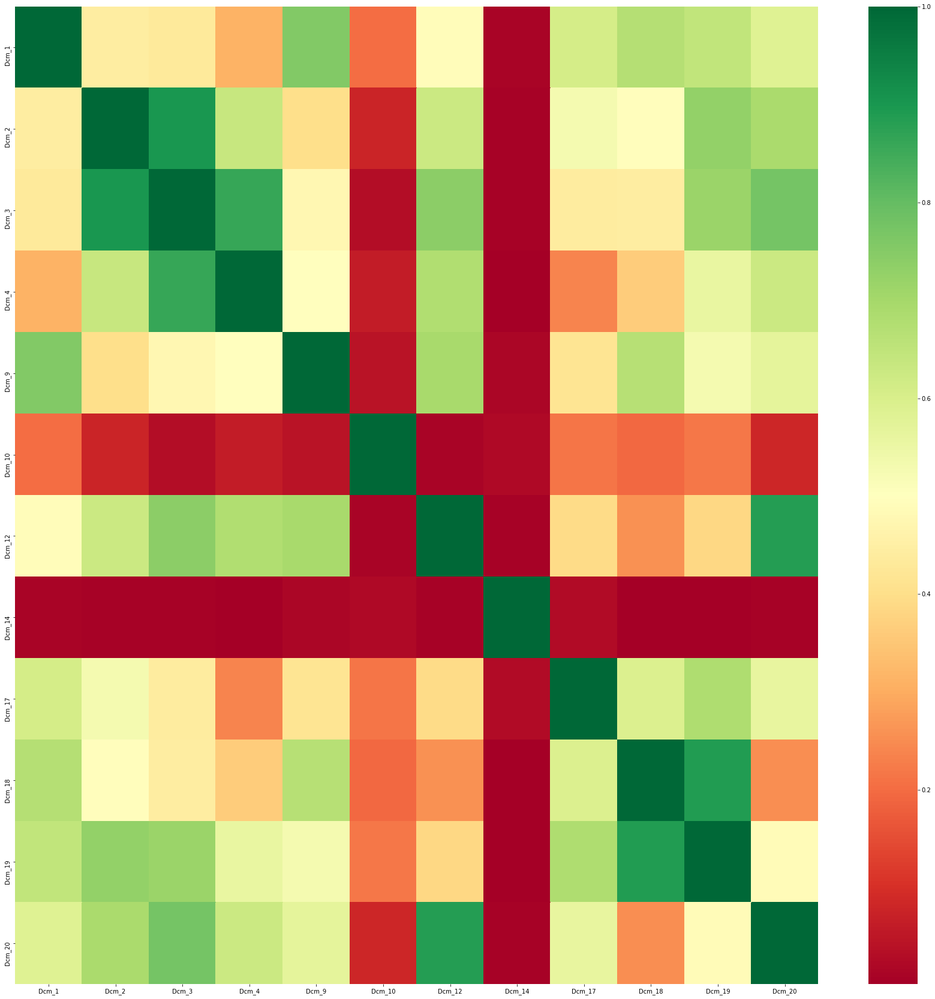

In [51]:
#Dicom_features

corr = data[Dicom_features].corr(method='spearman').abs()
f,ax = plt.subplots(1,1,figsize=(30,30))
sns.heatmap(corr,annot=False,cmap="RdYlGn",ax=ax)




Las variables con mayor correlación entre las DICOM son las Dcm_2, Dcm_3 y Dcm_4, ya que se refieren a la emisión de RX. También presentan asociación fuerte las Dcm_18 y Dcm_19 que se tratan de dosis de radiación. 
Las Dcm_10 y Dcm_14 son las que presentan menores relaciones con las demás variables. Tales se refieren a la fuerza de compresión aplicada a la mama y el ángulo del posicionador que son variables definidas por el equipamiento médico.

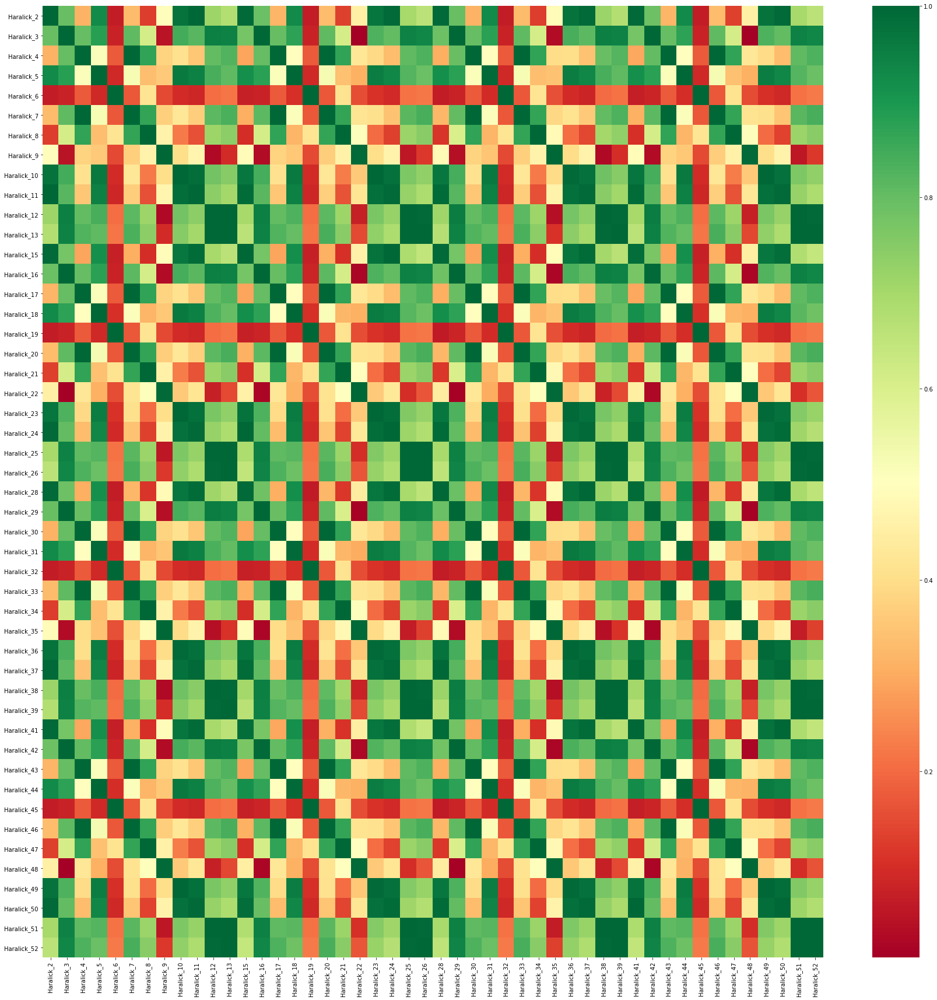

In [52]:
#Haralick_features
corr = data[Haralick_features].corr(method='spearman').abs()
f,ax = plt.subplots(1,1,figsize=(30,30))
sns.heatmap(corr,annot=False,cmap="RdYlGn",ax=ax)

En las Haralick se denota una alta correlación entre las variables y que se repite el patrón cuatro veces. 
Aquellas con menor correlación son las Haralick_6 (y sus repeticiones), la Haralick_8 con la Haralick_2 y la Haralick_9 con la Haralick_3. 
Mientras que las que tienen fuerte asociación serían las Haralick_11 y Haralick_12 con la Haralick_2, Haralick_4 con la Haralick_7. 

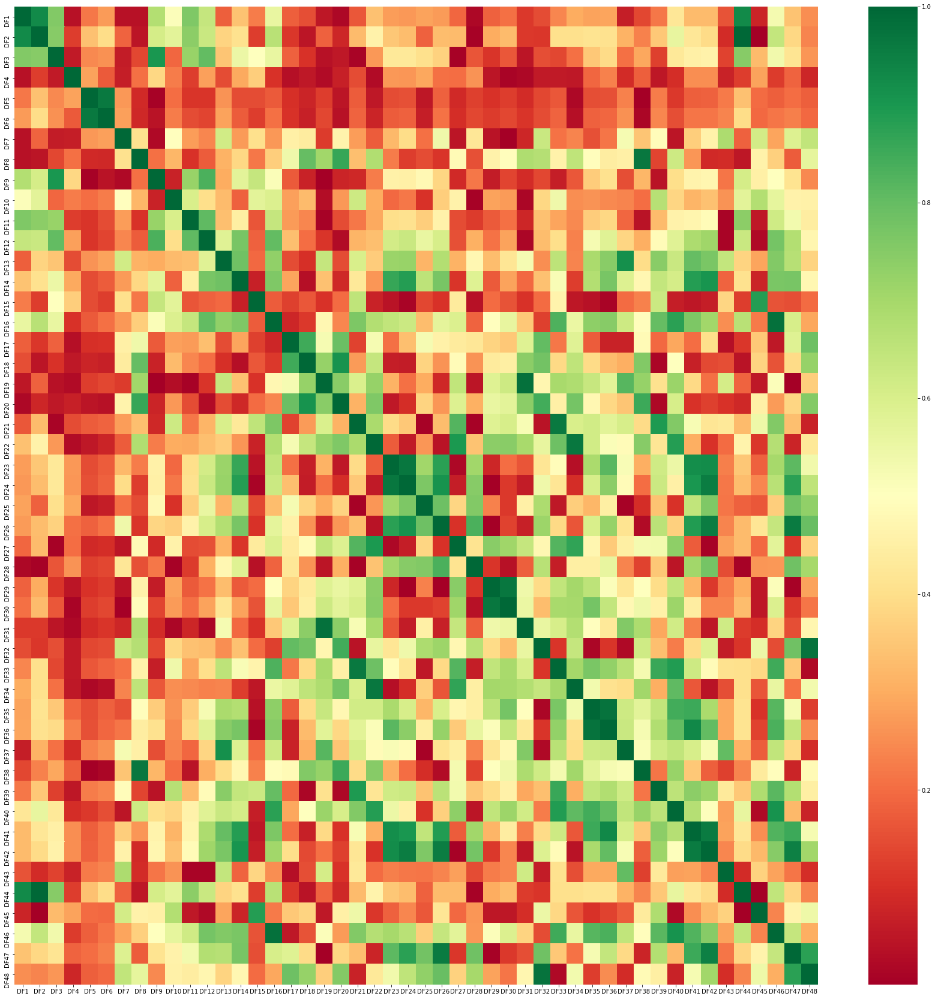

In [53]:
#Dimensión Fractal
corr = data[DF_features].corr(method='spearman').abs()
f,ax = plt.subplots(1,1,figsize=(30,30))
sns.heatmap(corr,annot=False,cmap="RdYlGn",ax=ax)

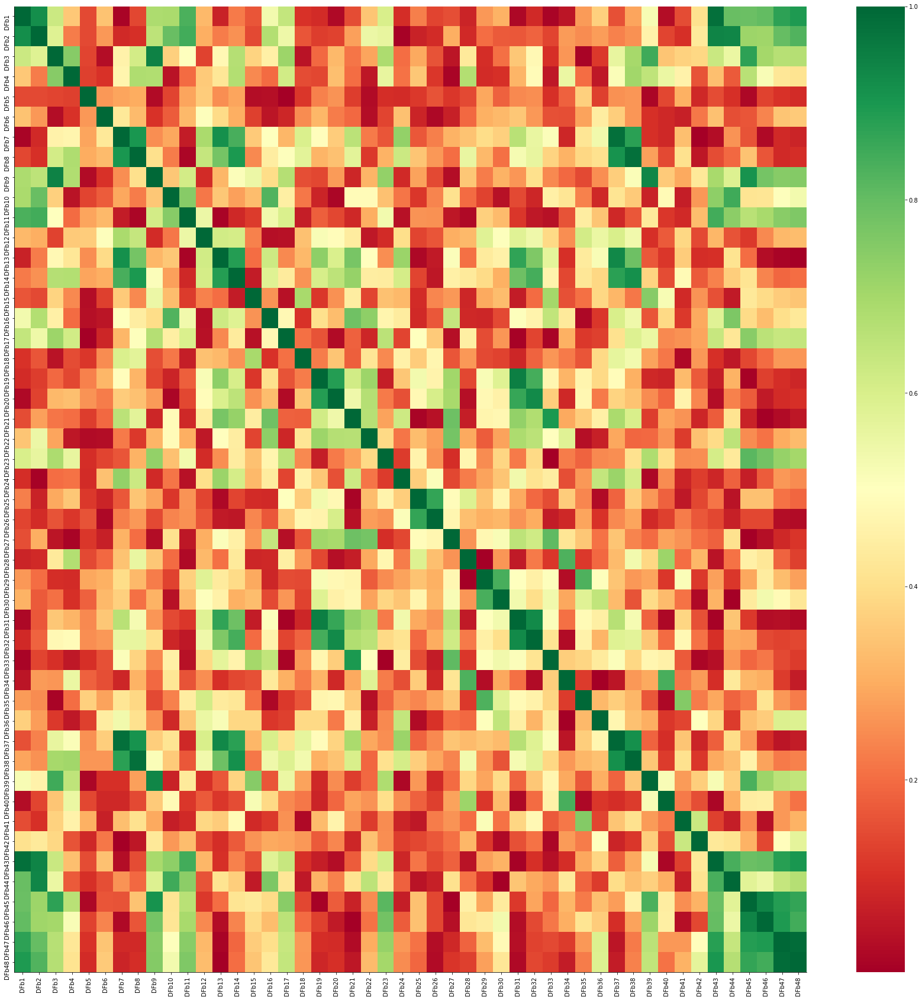

In [54]:
#Dimensión Fractal bordes
corr = data[DFb_features].corr(method='spearman').abs()
f,ax = plt.subplots(1,1,figsize=(30,30))
sns.heatmap(corr,annot=False,cmap="RdYlGn",ax=ax)
sns.despine()

De las dimensiones fractales podemos ver que en su gran mayoría no prsentan asociaciones fuertes entre ellas, con algunas excepciones. 

**Otras características**

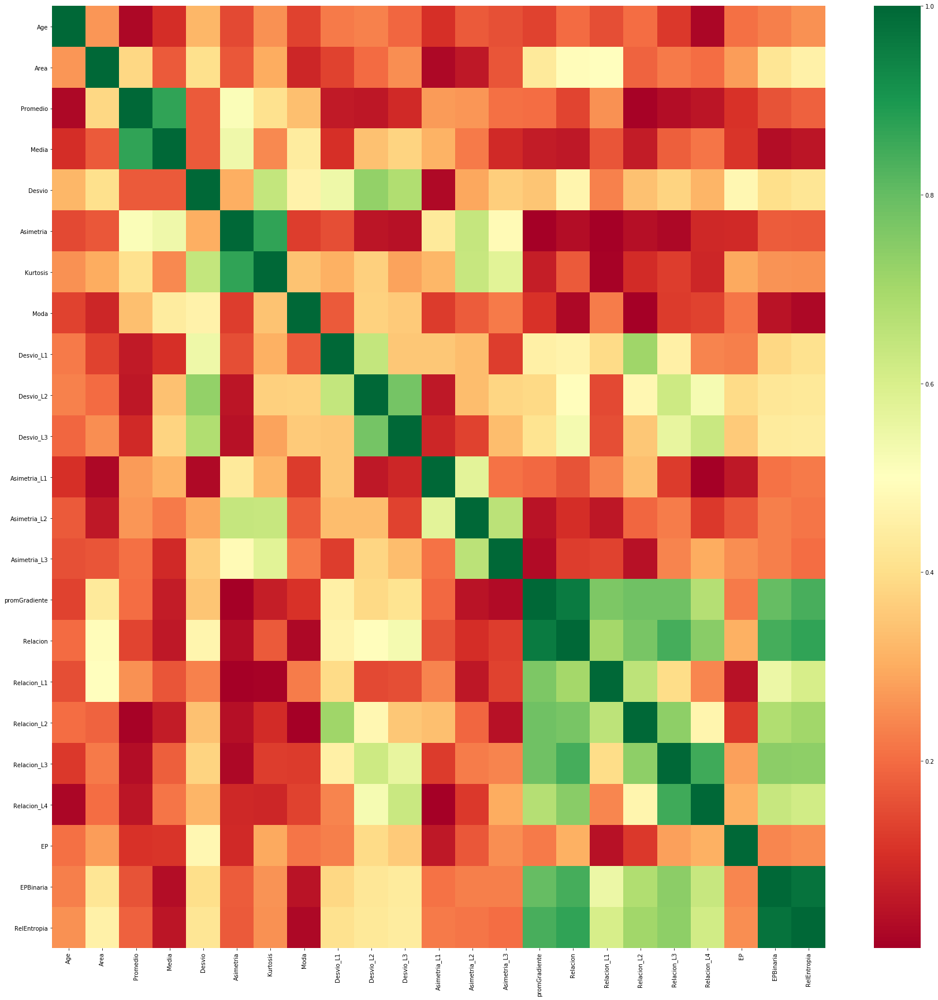

In [55]:
corr = data[Others_features].corr(method='spearman').abs()
f,ax = plt.subplots(1,1,figsize=(30,30))
sns.heatmap(corr,annot=False,cmap="RdYlGn",ax=ax)

De las demás características, no es posible distinguir correlaciones mas allá de las asociaciones lógicas dadas por las definiciones propias de los parámetros.

**4-Luego de un análisis exploratorio estime si existen variables que se muestren más relevantes para el problema final de clasificación.**

Del análisis de la correlación anterior se tomaron los pares de variables altamente correlacionadas (>0.95) y se descartó una de ellas para de esta forma disminuir la dimensión del problema.
Para la correlación de Spearman nos quedan 104 variables.
Además, se empleó la biblioteca *pandas_profiling* para comparar con nuestros resultados. Esta biblioteca haciendo un análisis similar se queda con 121 variables. Deberíamos realizar un estudio más profundo de cómo funciona esta biblioteca para determinar de donde proviene la diferencia. 



['Dcm_1', 'Dcm_2', 'Dcm_3', 'Dcm_4', 'Dcm_9', 'Dcm_10', 'Dcm_12', 'Dcm_14', 'Dcm_17', 'Dcm_18', 'Dcm_19', 'Dcm_20', 'Haralick_2', 'Haralick_3', 'Haralick_4', 'Haralick_5', 'Haralick_6', 'Haralick_7', 'Haralick_8', 'Haralick_9', 'Haralick_10', 'Haralick_11', 'Haralick_12', 'Haralick_13', 'Haralick_15', 'Haralick_16', 'Haralick_17', 'Haralick_18', 'Haralick_19', 'Haralick_20', 'Haralick_21', 'Haralick_22', 'Haralick_23', 'Haralick_24', 'Haralick_25', 'Haralick_26', 'Haralick_28', 'Haralick_29', 'Haralick_30', 'Haralick_31', 'Haralick_32', 'Haralick_33', 'Haralick_34', 'Haralick_35', 'Haralick_36', 'Haralick_37', 'Haralick_38', 'Haralick_39', 'Haralick_41', 'Haralick_42', 'Haralick_43', 'Haralick_44', 'Haralick_45', 'Haralick_46', 'Haralick_47', 'Haralick_48', 'Haralick_49', 'Haralick_50', 'Haralick_51', 'Haralick_52', 'DF1', 'DF2', 'DF3', 'DF4', 'DF5', 'DF6', 'DF7', 'DF8', 'DF9', 'DF10', 'DF11', 'DF12', 'DF13', 'DF14', 'DF15', 'DF16', 'DF17', 'DF18', 'DF19', 'DF20', 'DF21', 'DF22', 'DF23

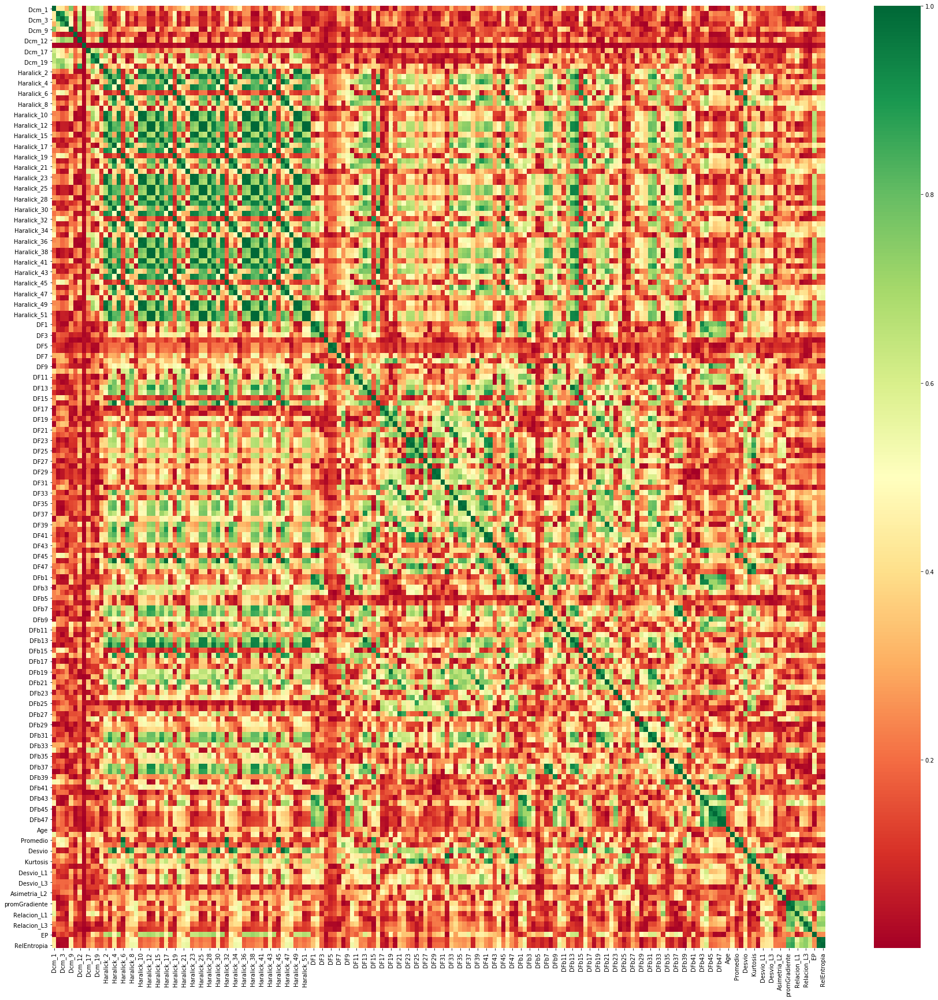

In [56]:
All_features = Dicom_features + Haralick_features + DF_features + DFb_features + Others_features
print(All_features,len(All_features))
corr = data[All_features].corr(method='spearman').abs()
f,ax = plt.subplots(1,1,figsize=(30,30))
sns.heatmap(corr,annot=False,cmap="RdYlGn",ax=ax)

In [57]:
upper = corr.where(np.triu(np.ones(corr.shape),k=1).astype(np.bool))

In [58]:
for column in upper.columns:
    print(column)
    for i in range(1,upper[column].shape[0]):
        if(upper[column][i] > 0.95):
            print('    ',upper[column].index[i],upper[column][i])
           

Dcm_1
Dcm_2
Dcm_3
Dcm_4
Dcm_9
Dcm_10
Dcm_12
Dcm_14
Dcm_17
Dcm_18
Dcm_19
Dcm_20
Haralick_2
Haralick_3
Haralick_4
Haralick_5
Haralick_6
Haralick_7
     Haralick_4 0.9998440855335414
Haralick_8
Haralick_9
Haralick_10
     Haralick_2 0.9756056745051138
     Haralick_5 0.9623554797958072
Haralick_11
     Haralick_2 0.9975751832384895
     Haralick_10 0.9851134940896852
Haralick_12
     Haralick_3 0.9532022421794836
Haralick_13
     Haralick_12 0.9968553848212862
Haralick_15
     Haralick_2 0.993403309797831
     Haralick_10 0.9684077855866949
     Haralick_11 0.9901554654085589
Haralick_16
     Haralick_3 0.9978322670044605
     Haralick_12 0.9533393964581445
Haralick_17
     Haralick_4 0.999999042414271
     Haralick_7 0.9998449557613777
Haralick_18
     Haralick_5 0.9968387622623025
     Haralick_10 0.9621641913504901
Haralick_19
     Haralick_6 0.9999991406976385
Haralick_20
     Haralick_4 0.9997943467129248
     Haralick_7 0.999993126499215
     Haralick_17 0.9997964132802473
Haralick_

In [59]:
threshold = 0.95
to_drop = [column for column in upper.columns if any(upper[column] > threshold)]

In [60]:
print(len(to_drop))
print(to_drop)

75
['Haralick_7', 'Haralick_10', 'Haralick_11', 'Haralick_12', 'Haralick_13', 'Haralick_15', 'Haralick_16', 'Haralick_17', 'Haralick_18', 'Haralick_19', 'Haralick_20', 'Haralick_21', 'Haralick_22', 'Haralick_23', 'Haralick_24', 'Haralick_25', 'Haralick_26', 'Haralick_28', 'Haralick_29', 'Haralick_30', 'Haralick_31', 'Haralick_32', 'Haralick_33', 'Haralick_34', 'Haralick_35', 'Haralick_36', 'Haralick_37', 'Haralick_38', 'Haralick_39', 'Haralick_41', 'Haralick_42', 'Haralick_43', 'Haralick_44', 'Haralick_45', 'Haralick_46', 'Haralick_47', 'Haralick_48', 'Haralick_49', 'Haralick_50', 'Haralick_51', 'Haralick_52', 'DF6', 'DF16', 'DF24', 'DF30', 'DF31', 'DF33', 'DF34', 'DF36', 'DF38', 'DF42', 'DF44', 'DF45', 'DF46', 'DF47', 'DF48', 'DFb1', 'DFb3', 'DFb9', 'DFb13', 'DFb14', 'DFb19', 'DFb21', 'DFb27', 'DFb31', 'DFb37', 'DFb38', 'DFb43', 'DFb48', 'Promedio', 'Desvio', 'Asimetria', 'Kurtosis', 'Relacion', 'RelEntropia']


In [61]:
_data = data[All_features]
_data = _data.drop(to_drop,axis=1)

In [62]:
print(data.shape)
print(_data.shape)

(6394, 198)
(6394, 104)


In [ ]:
import pandas_profiling as pp

In [ ]:
pr = pp.ProfileReport(data[All_features],bins=50,correlation_threshold=0.95)

In [ ]:
pr.to_file(outputfile="output.html")